In [60]:
import os
from pathlib import Path
import numpy as np
import pandas as pd

import spectral as sp
# import pysptools.spectro as spectro
import scipy.signal as ss

import matplotlib as mpl
import matplotlib.pyplot as plt
# import random
# import matplotlib.patches as patches
# from mpl_toolkits.axes_grid1 import make_axes_locatable
from tqdm.notebook import tqdm

# Pigment content maps
- Create dictionary with samples crop size, masked and simple to visualize.

In [61]:
# Files path
files_path = Path(r"C:\Users\jcmontes\OneDrive - University of Tasmania\01_Projects_Drive\UHI_Tank\data\JCMH-FC-Reflectance")

#Files Live-Epibiota-Shells
f1_path = files_path / 'T1-Live-Epibiota-Shells'

# Reflectance images
hdr_list = list(f1_path.glob('*.hdr'))
bin_list = list(f1_path.glob('*.img'))

# List of files
targets = list(zip(hdr_list,bin_list))

In [74]:
out_p = r"C:\Users\jcmontes\OneDrive - University of Tasmania\01_Projects_Drive\UHI_Tank\results/"

In [63]:
# Several tests to get this dimensions. Can be fixed with improvements to Translation stage
sample_dims = [
[(50,210),(50,500)],
[(65,200),(10,470)],
[(90,220),(40,475)],
[(30,210),(90,480)],
[(40,235),(65,490)],
[(30,170),(65,490)],
[(35,160),(50,460)],
[(95,250),(50,480)],
[(40,185),(65,500)],
[(40,190),(40,500)],
[(50,205),(70,490)]
]

## Experiment 1 - Live Epibiota Shells
#### Create Sample dictionary with custom dimensions

In [64]:
sample_key = [] # Empty list for sample names (strings)
sample_dict = {} # Empty dict for Original Reflectance data cubes (np.ndarray)
dd_dict = {}
kmeans_dict = {} # Empty dict for k-means results
map_dict = {}

#K mean number of clusters
n_clusters = 3


# Begin
for i, sample in enumerate(tqdm(targets)):
    sample_key.append(sample[0].stem[28:-12])
    print(sample_key[i])
    target_open = sp.envi.open(sample[0], sample[1])
    target_data = target_open.load()
    
    # Build dictionaries - Reflectance and Derivatives
    sample_dict[sample_key[i]] = ss.savgol_filter(target_data[:,:,3:238], 3, 1, axis=2).copy()
    dd_dict[sample_key[i]] = ss.savgol_filter(target_data[:,:,3:238], 15, 3, axis=2, deriv=2).copy()
    
    #Adjust the arrays to specific dimensions with only the targets 
    sample_dict[sample_key[i]] = sample_dict[sample_key[i]][sample_dims[i][0][0]:sample_dims[i][0][1], 
                                                            sample_dims[i][1][0]:sample_dims[i][1][1], :].copy()
    dd_dict[sample_key[i]] = dd_dict[sample_key[i]][sample_dims[i][0][0]:sample_dims[i][0][1], sample_dims[i][1][0]:sample_dims[i][1][1], :].copy()
    # map_dict[sample_key[i]] = np.empty((sample_dict[sample_key[i]].shape[0], sample_dict[sample_key[i]].shape[1], 1), dtype=np.float64)
    
    # Masking
    mask = sample_dict[sample_key[i]][:,:,62:70].mean() < 0.02 # 500 nm threshold
    sample_m = sample_dict[sample_key[i]].copy() # Copy array
    sample_m[mask] = 0 # Apply mask
    sample_dict[sample_key[i]] = sample_m.copy() # Save
    
    sample_mdd = dd_dict[sample_key[i]].copy()
    sample_mdd[mask] = 0.01 # Apply mask on dd array
    dd_dict[sample_key[i]] = sample_mdd.copy()
    
    ## K means
    (m,c) = sp.kmeans(sample_dict[sample_key[i]],n_clusters,8)
    kmeans_dict[sample_key[i]] = (m.copy(),c.copy()) # Store k-means results in the kmeans_dict dictionary

# Save wavelengths
wvl = [float(i) for i in target_open.metadata['wavelength'][3:238]]
print('Done :)')

  0%|          | 0/11 [00:00<?, ?it/s]

Small-Tray01


spectral:INFO: k-means iteration 1 - 26028 pixels reassigned.
spectral:INFO: k-means iteration 2 - 2359 pixels reassigned.
spectral:INFO: k-means iteration 3 - 1929 pixels reassigned.
spectral:INFO: k-means iteration 4 - 6643 pixels reassigned.
spectral:INFO: k-means iteration 5 - 10253 pixels reassigned.
spectral:INFO: k-means iteration 6 - 6459 pixels reassigned.
spectral:INFO: k-means iteration 7 - 2382 pixels reassigned.
spectral:INFO: k-means iteration 8 - 811 pixels reassigned.
spectral:INFO: kmeans terminated with 3 clusters after 8 iterations.


Small-Tray02


spectral:INFO: k-means iteration 1 - 24498 pixels reassigned.
spectral:INFO: k-means iteration 2 - 6417 pixels reassigned.
spectral:INFO: k-means iteration 3 - 5858 pixels reassigned.
spectral:INFO: k-means iteration 4 - 5187 pixels reassigned.
spectral:INFO: k-means iteration 5 - 2571 pixels reassigned.
spectral:INFO: k-means iteration 6 - 1018 pixels reassigned.
spectral:INFO: k-means iteration 7 - 558 pixels reassigned.
spectral:INFO: k-means iteration 8 - 393 pixels reassigned.
spectral:INFO: kmeans terminated with 3 clusters after 8 iterations.


Small-Tray03


spectral:INFO: k-means iteration 1 - 32013 pixels reassigned.
spectral:INFO: k-means iteration 2 - 4612 pixels reassigned.
spectral:INFO: k-means iteration 3 - 4303 pixels reassigned.
spectral:INFO: k-means iteration 4 - 4000 pixels reassigned.
spectral:INFO: k-means iteration 5 - 1733 pixels reassigned.
spectral:INFO: k-means iteration 6 - 714 pixels reassigned.
spectral:INFO: k-means iteration 7 - 358 pixels reassigned.
spectral:INFO: k-means iteration 8 - 239 pixels reassigned.
spectral:INFO: kmeans terminated with 3 clusters after 8 iterations.


Small-Tray04


spectral:INFO: k-means iteration 1 - 61881 pixels reassigned.
spectral:INFO: k-means iteration 2 - 3993 pixels reassigned.
spectral:INFO: k-means iteration 3 - 1032 pixels reassigned.
spectral:INFO: k-means iteration 4 - 360 pixels reassigned.
spectral:INFO: k-means iteration 5 - 86 pixels reassigned.
spectral:INFO: k-means iteration 6 - 13 pixels reassigned.
spectral:INFO: k-means iteration 7 - 2 pixels reassigned.
spectral:INFO: k-means iteration 8 - 1 pixels reassigned.
spectral:INFO: kmeans terminated with 2 clusters after 8 iterations.


Med-Tray01


spectral:INFO: k-means iteration 1 - 9300 pixels reassigned.
spectral:INFO: k-means iteration 2 - 5227 pixels reassigned.
spectral:INFO: k-means iteration 3 - 996 pixels reassigned.
spectral:INFO: k-means iteration 4 - 466 pixels reassigned.
spectral:INFO: k-means iteration 5 - 445 pixels reassigned.
spectral:INFO: k-means iteration 6 - 351 pixels reassigned.
spectral:INFO: k-means iteration 7 - 279 pixels reassigned.
spectral:INFO: k-means iteration 8 - 249 pixels reassigned.
spectral:INFO: kmeans terminated with 3 clusters after 8 iterations.


Med-Tray02


spectral:INFO: k-means iteration 1 - 12693 pixels reassigned.
spectral:INFO: k-means iteration 2 - 3361 pixels reassigned.
spectral:INFO: k-means iteration 3 - 3682 pixels reassigned.
spectral:INFO: k-means iteration 4 - 4253 pixels reassigned.
spectral:INFO: k-means iteration 5 - 5712 pixels reassigned.
spectral:INFO: k-means iteration 6 - 6571 pixels reassigned.
spectral:INFO: k-means iteration 7 - 3759 pixels reassigned.
spectral:INFO: k-means iteration 8 - 1615 pixels reassigned.
spectral:INFO: kmeans terminated with 3 clusters after 8 iterations.


Med-Tray03


spectral:INFO: k-means iteration 1 - 30900 pixels reassigned.
spectral:INFO: k-means iteration 2 - 7579 pixels reassigned.
spectral:INFO: k-means iteration 3 - 3485 pixels reassigned.
spectral:INFO: k-means iteration 4 - 1164 pixels reassigned.
spectral:INFO: k-means iteration 5 - 477 pixels reassigned.
spectral:INFO: k-means iteration 6 - 388 pixels reassigned.
spectral:INFO: k-means iteration 7 - 332 pixels reassigned.
spectral:INFO: k-means iteration 8 - 255 pixels reassigned.
spectral:INFO: kmeans terminated with 3 clusters after 8 iterations.


Large-Tray01


spectral:INFO: k-means iteration 1 - 18795 pixels reassigned.
spectral:INFO: k-means iteration 2 - 9681 pixels reassigned.
spectral:INFO: k-means iteration 3 - 5363 pixels reassigned.
spectral:INFO: k-means iteration 4 - 2395 pixels reassigned.
spectral:INFO: k-means iteration 5 - 1821 pixels reassigned.
spectral:INFO: k-means iteration 6 - 2260 pixels reassigned.
spectral:INFO: k-means iteration 7 - 2376 pixels reassigned.
spectral:INFO: k-means iteration 8 - 1771 pixels reassigned.
spectral:INFO: kmeans terminated with 3 clusters after 8 iterations.


Large-Tray02


spectral:INFO: k-means iteration 1 - 7337 pixels reassigned.
spectral:INFO: k-means iteration 2 - 3585 pixels reassigned.
spectral:INFO: k-means iteration 3 - 564 pixels reassigned.
spectral:INFO: k-means iteration 4 - 168 pixels reassigned.
spectral:INFO: k-means iteration 5 - 179 pixels reassigned.
spectral:INFO: k-means iteration 6 - 212 pixels reassigned.
spectral:INFO: k-means iteration 7 - 317 pixels reassigned.
spectral:INFO: k-means iteration 8 - 658 pixels reassigned.
spectral:INFO: kmeans terminated with 3 clusters after 8 iterations.


Large-Tray03


spectral:INFO: k-means iteration 1 - 14086 pixels reassigned.
spectral:INFO: k-means iteration 2 - 4575 pixels reassigned.
spectral:INFO: k-means iteration 3 - 2642 pixels reassigned.
spectral:INFO: k-means iteration 4 - 1489 pixels reassigned.
spectral:INFO: k-means iteration 5 - 1634 pixels reassigned.
spectral:INFO: k-means iteration 6 - 1358 pixels reassigned.
spectral:INFO: k-means iteration 7 - 1094 pixels reassigned.
spectral:INFO: k-means iteration 8 - 915 pixels reassigned.
spectral:INFO: kmeans terminated with 3 clusters after 8 iterations.


Large-Tray04


spectral:INFO: k-means iteration 1 - 24306 pixels reassigned.
spectral:INFO: k-means iteration 2 - 5563 pixels reassigned.
spectral:INFO: k-means iteration 3 - 5346 pixels reassigned.
spectral:INFO: k-means iteration 4 - 5232 pixels reassigned.
spectral:INFO: k-means iteration 5 - 3338 pixels reassigned.
spectral:INFO: k-means iteration 6 - 1967 pixels reassigned.
spectral:INFO: k-means iteration 7 - 1042 pixels reassigned.
spectral:INFO: k-means iteration 8 - 566 pixels reassigned.
spectral:INFO: kmeans terminated with 3 clusters after 8 iterations.


Done :)


In [65]:
sample_key

['Small-Tray01',
 'Small-Tray02',
 'Small-Tray03',
 'Small-Tray04',
 'Med-Tray01',
 'Med-Tray02',
 'Med-Tray03',
 'Large-Tray01',
 'Large-Tray02',
 'Large-Tray03',
 'Large-Tray04']

In [66]:
wvl[100]

569.45

In [67]:
## Adjust to just use trays that are full
sample_key.remove('Small-Tray04')
sample_key.remove('Med-Tray03')

In [68]:
## Color maps
from cycler import cycler

# Set the colormap for plt.imshow
cmap = plt.cm.Dark2
# Set the color cycle for plt.plot
colors = cmap(np.linspace(0, 1, n_clusters))
plt.rc('axes', prop_cycle=(cycler('color', colors)))

## Visualization of multiple specimen trays
- RGB bands, NDVI, double derivative at 563 nm (R-Phycoerythrin) and outputs of an unsupervised 5 k mean cluster

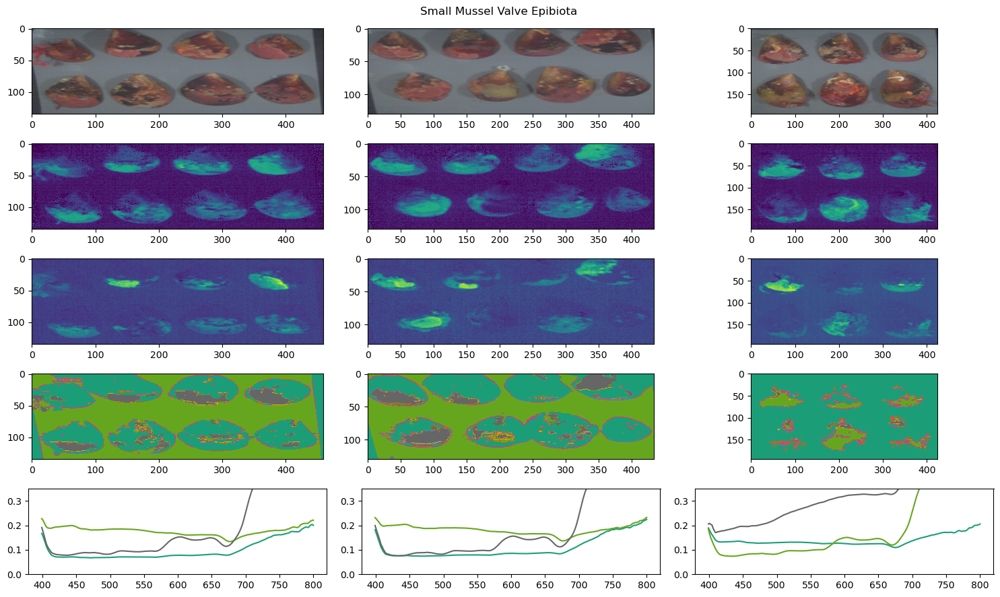

In [69]:
fig, axs = plt.subplots(5,3, sharex=False, sharey=False, figsize=(15,9), gridspec_kw={'width_ratios':[2,2,2], 'height_ratios': [2,2,2,2,2]})
fig.suptitle('Small Mussel Valve Epibiota', fontsize=12)

for i, tray in enumerate(sample_key[1:4]):
    row = i // 3
    col = i % 3
    axs[row, col].imshow((sample_dict[tray][:, :, (175,92,12)]**0.45), interpolation='spline36')
    

for i, tray in enumerate(sample_key[1:4]):
    row = (i+3) // 3
    col = (i+3) % 3
    axs[row, col].imshow((sample_dict[tray][:, :, 179] - sample_dict[tray][:, :, 159]) /
                         (sample_dict[tray][:, :, 179] + sample_dict[tray][:, :, 159]), vmin=0.01, vmax=1, interpolation='spline36')

for i, tray in enumerate(sample_key[1:4]):
    row = (i+6) // 3
    col = (i+6) % 3
    axs[row, col].imshow((dd_dict[tray][:, :, 100]), 
                         norm=mpl.colors.Normalize(vmin=dd_dict[tray][:, :, 100].min(), vmax=dd_dict[tray][:, :, 100].max()))
    
for i, tray in enumerate(sample_key[1:4]):
    row = (i+9) // 3
    col = (i+9) % 3
    axs[row, col].imshow(kmeans_dict[tray][0], cmap=cmap)

for i, tray in enumerate(sample_key[1:4]):
    row = (i+12) // 3
    col = (i+12) % 3
    for i in range(kmeans_dict[tray][1].shape[0]):
        axs[row, col].set_ylim([0,0.35])
        axs[row, col].plot(np.linspace(399,800,235), kmeans_dict[tray][1][i,:])

plt.subplots_adjust(left=0.01, bottom=0.00001, wspace=0.00001, hspace=0.00001)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

In [70]:
sample_key.remove("Small-Tray04")

ValueError: list.remove(x): x not in list

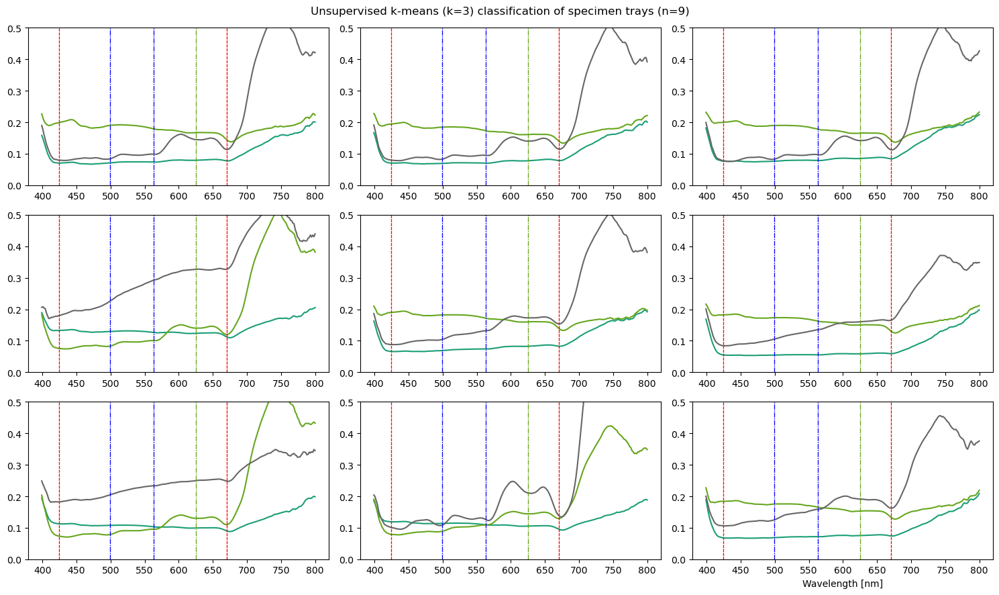

In [89]:
fig, axs = plt.subplots(3,3, sharex=False, sharey=False, figsize=(15,9), gridspec_kw={'width_ratios':[2,2,2], 'height_ratios': [2,2,2]})
fig.suptitle('Unsupervised k-means (k=3) classification of specimen trays (n=9)', fontsize=12)
plt.xlabel('Wavelength [nm]')

for i, tray in enumerate(sample_key[:]):
    row = (i) // 3
    col = (i) % 3
    for i in range(kmeans_dict[tray][1].shape[0]):
        axs[row, col].set_ylim([0,0.5])
        axs[row, col].plot(np.linspace(399,800,235), kmeans_dict[tray][1][i,:])
        axs[row, col].axvline(499, linewidth=0.8, linestyle='-.', color='blue', label='R-PE') #PE
        axs[row, col].axvline(563, linewidth=0.8, linestyle='-.', color='blue') #PE
        axs[row, col].axvline(625, linewidth=0.8, linestyle='-.', color='C4', label='R-PC') #PC
        # axs[row, col].axvline(652, linewidth=0.8, linestyle='-.', color='blue') #APC
        axs[row, col].axvline(670, linewidth=0.8, linestyle='--', color='red', label='Chl a') #Chl a
        axs[row, col].axvline(424, linewidth=0.8, linestyle='--', color='red') #Chl a
        

# for i, tray in enumerate(sample_key[1:4]):
#     row = (i+12) // 3
#     col = (i+12) % 3
#     for i in range(kmeans_dict[tray][1].shape[0]):
#         axs[row, col].set_ylim([0,0.35])
#         axs[row, col].plot(np.linspace(399,800,235), kmeans_dict[tray][1][i,:])


plt.subplots_adjust(left=0.01, bottom=0.00001, wspace=0.00001, hspace=0.00001)
plt.tight_layout()
# plt.savefig(out_p + 'k-means-all-samples.png', dpi=600)
plt.show()

In [241]:
for i, tray in enumerate(sample_key):
    row = i // 3
    col = i % 3
    axs[row, col].imshow((sample_dict[tray][:, :, 179] - sample_dict[tray][:, :, 159]) /
                         (sample_dict[tray][:, :, 179] + sample_dict[tray][:, :, 159]), vmin=0.01, vmax=1, interpolation='spline16')

plt.subplots_adjust(left=0.00001, bottom=0.00001, wspace=0.00001, hspace=0.00001)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

C:\Users\jcmontes\AppData\Local\Temp\ipykernel_10564\34785554.py:4: RuntimeWarning: invalid value encountered in true_divide
  axs[row, col].imshow((sample_dict[tray][:, :, 179] - sample_dict[tray][:, :, 159]) /


<Figure size 640x480 with 0 Axes>

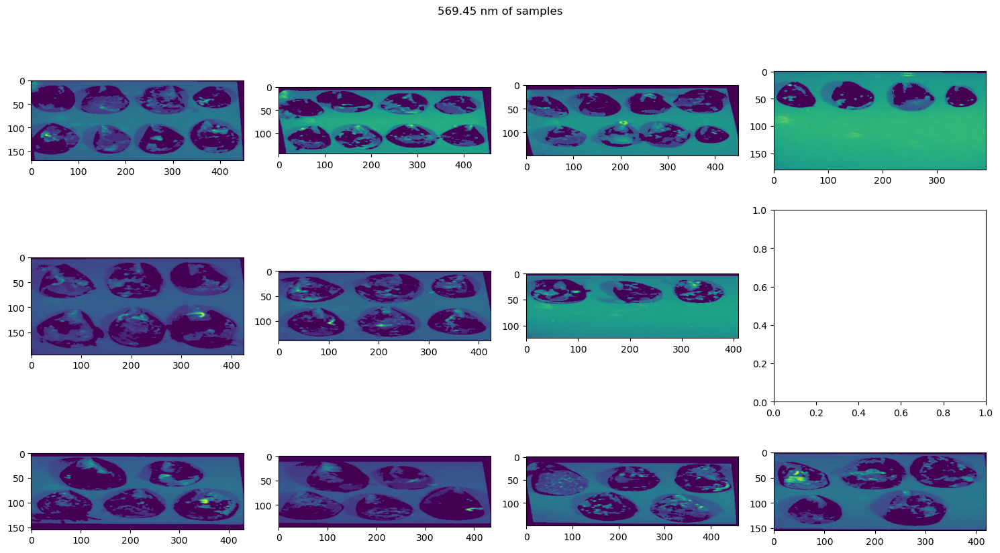

In [42]:
band = 100 #569.45 nm


fig, axs = plt.subplots(3,4, sharex=False, sharey=False, figsize=(15,9))
fig.suptitle(str(wvl[band]) + ' nm of samples')

axs[0,0].imshow(sample_dict['Small-Tray01'][..., band])
axs[0,1].imshow(sample_dict['Small-Tray02'][..., band]) #CE
axs[0,2].imshow(sample_dict['Small-Tray03'][..., band]) #CE
axs[0,3].imshow(sample_dict['Small-Tray04'][..., band]) #CE

axs[1,0].imshow(sample_dict['Med-Tray01'][..., band])
axs[1,1].imshow(sample_dict['Med-Tray02'][..., band])
axs[1,2].imshow(sample_dict['Med-Tray03'][..., band])

axs[2,0].imshow(sample_dict['Large-Tray01'][..., band])
axs[2,1].imshow(sample_dict['Large-Tray02'][..., band])
axs[2,2].imshow(sample_dict['Large-Tray03'][..., band])
axs[2,3].imshow(sample_dict['Large-Tray04'][..., band])

plt.subplots_adjust(left=0.00001, bottom=0.00001, wspace=0.00001, hspace=0.00001)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

### Experiment 1 - Double derivatives

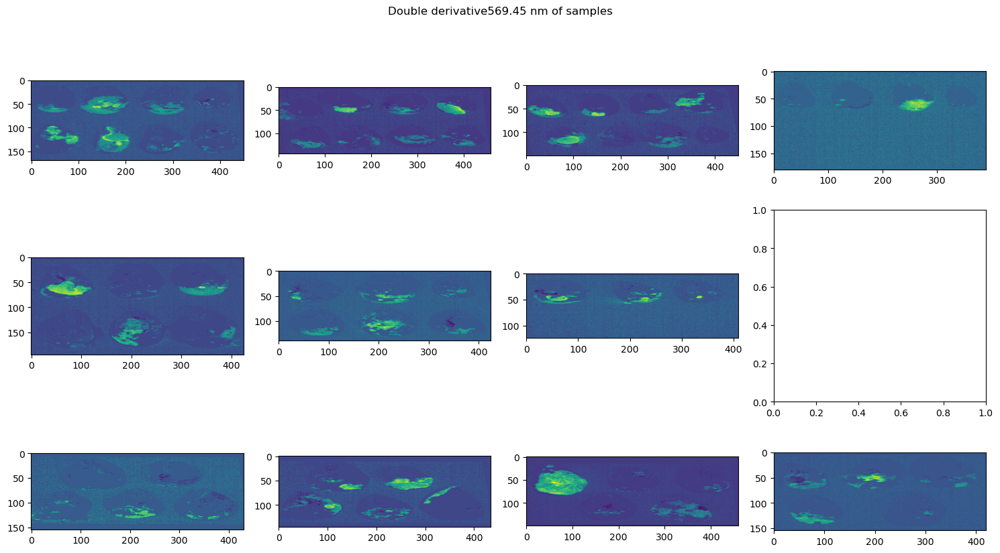

In [45]:
fig, axs = plt.subplots(3,4, sharex=False, sharey=False, figsize=(15,9))
fig.suptitle('Double derivative' + str(wvl[band]) + ' nm of samples')

axs[0,0].imshow(dd_dict['Small-Tray01'][..., band])
axs[0,1].imshow(dd_dict['Small-Tray02'][..., band]) #CE
axs[0,2].imshow(dd_dict['Small-Tray03'][..., band]) #CE
axs[0,3].imshow(dd_dict['Small-Tray04'][..., band]) #CE

axs[1,0].imshow(dd_dict['Med-Tray01'][..., band])
axs[1,1].imshow(dd_dict['Med-Tray02'][..., band])
axs[1,2].imshow(dd_dict['Med-Tray03'][..., band])

axs[2,0].imshow(dd_dict['Large-Tray01'][..., band])
axs[2,1].imshow(dd_dict['Large-Tray02'][..., band])
axs[2,2].imshow(dd_dict['Large-Tray03'][..., band])
axs[2,3].imshow(dd_dict['Large-Tray04'][..., band])

plt.subplots_adjust(left=0.00001, bottom=0.00001, wspace=0.00001, hspace=0.00001)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

### K-means plot

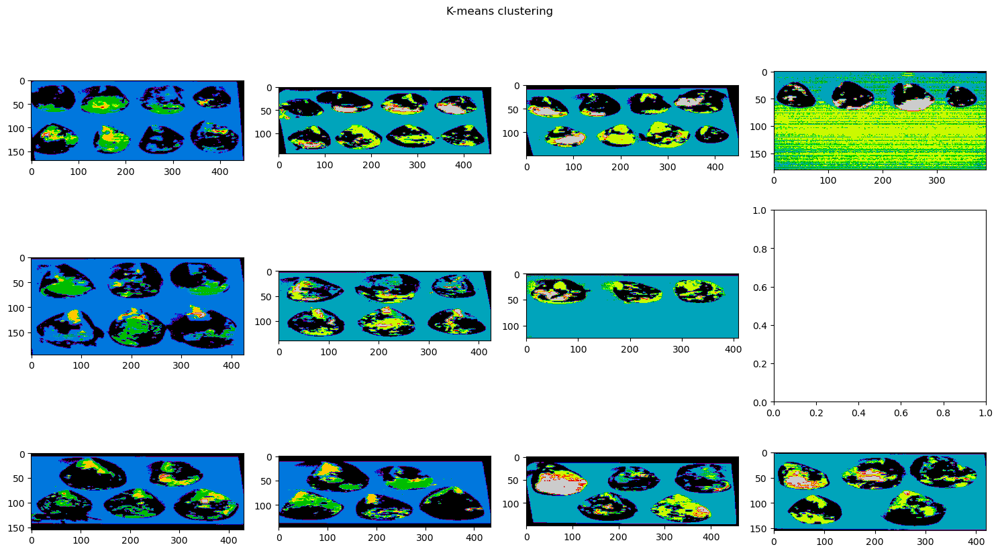

In [44]:
fig, axs = plt.subplots(3,4, sharex=False, sharey=False, figsize=(15,9))
fig.suptitle('K-means clustering')

axs[0,0].imshow(kmeans_dict['Small-Tray01'][0], cmap='nipy_spectral')
axs[0,1].imshow(kmeans_dict['Small-Tray02'][0], cmap='nipy_spectral')
axs[0,2].imshow(kmeans_dict['Small-Tray03'][0], cmap='nipy_spectral')
axs[0,3].imshow(kmeans_dict['Small-Tray04'][0], cmap='nipy_spectral')

axs[1,0].imshow(kmeans_dict['Med-Tray01'][0], cmap='nipy_spectral')
axs[1,1].imshow(kmeans_dict['Med-Tray02'][0], cmap='nipy_spectral')
axs[1,2].imshow(kmeans_dict['Med-Tray03'][0], cmap='nipy_spectral')

axs[2,0].imshow(kmeans_dict['Large-Tray01'][0], cmap='nipy_spectral')
axs[2,1].imshow(kmeans_dict['Large-Tray02'][0], cmap='nipy_spectral')
axs[2,2].imshow(kmeans_dict['Large-Tray03'][0], cmap='nipy_spectral')
axs[2,3].imshow(kmeans_dict['Large-Tray04'][0], cmap='nipy_spectral')

plt.subplots_adjust(left=0.00001, bottom=0.00001, wspace=0.00001, hspace=0.00001)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

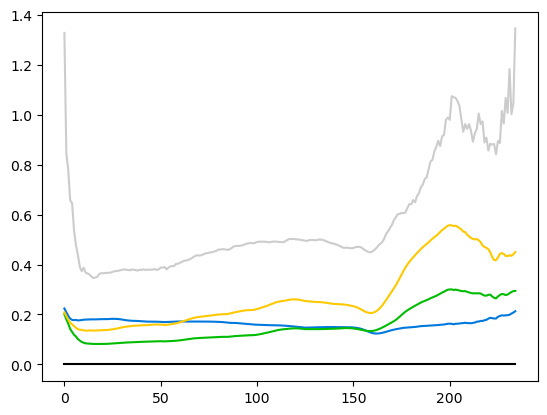

In [46]:
from cycler import cycler

# Set the color cycle for plt.plot
colors = plt.cm.nipy_spectral(np.linspace(0, 1, 5))
plt.rc('axes', prop_cycle=(cycler('color', colors)))

for i in range(c.shape[0]):
    plt.plot(c[i,:])
plt.show()

## Experiment 2 - Epibiota Light Deprived

In [78]:
# Files path
files_path = Path(r"C:\Users\jcmontes\OneDrive - University of Tasmania\01_Projects_Drive\UHI_Tank\data\JCMH-FC-Reflectance")

#Files Live-Epibiota-Shells
f2_path = files_path / 'T2-Epibiota-Light-Deprived'

# Reflectance images
hdr_list = list(f2_path.glob('*.hdr'))
bin_list = list(f2_path.glob('*.img'))

# List of files
targets = list(zip(hdr_list,bin_list))

In [79]:
sample_key = [] # Empty list for sample names (strings)
sample_dict = {} # Empty dict for Original Reflectance data cubes (np.ndarray)
dd_dict = {}
map_dict = {} # Pigment map dictionary (2D arrays with same Y & X dims as samples) - The canvas

# Begin
for i, sample in enumerate(tqdm(targets)):
    sample_key.append(sample[0].stem[20:-12])
    print(sample_key[i])
    target_open = sp.envi.open(sample[0], sample[1])
    target_data = target_open.load()
    
    # Build dictionaries - Reflectance and Derivatives
    sample_dict[sample_key[i]] = ss.savgol_filter(target_data[:,:,3:238], 3, 1, axis=2).copy()
    dd_dict[sample_key[i]] = ss.savgol_filter(target_data[:,:,3:238], 15, 3, axis=2, deriv=2).copy()
    
    # Adjust the arrays to specific dimensions with only the targets 
    # sample_dict[sample_key[i]] = sample_dict[sample_key[i]][sample_dims[i][0][0]:sample_dims[i][0][1], 
    #                                                         sample_dims[i][1][0]:sample_dims[i][1][1], :].copy()
    # dd_dict[sample_key[i]] = dd_dict[sample_key[i]][sample_dims[i][0][0]:sample_dims[i][0][1], sample_dims[i][1][0]:sample_dims[i][1][1], :].copy()
    map_dict[sample_key[i]] = np.empty((sample_dict[sample_key[i]].shape[0], sample_dict[sample_key[i]].shape[1], 1), dtype=np.float64)
    
    # Masking
    mask = sample_dict[sample_key[i]][:,:,135] < 0.1 # 800 nm threshold
    sample_m = sample_dict[sample_key[i]].copy() # Copy array
    sample_m[mask] = 0 # Apply mask
    sample_dict[sample_key[i]] = sample_m.copy() # Save
    
    sample_mdd = dd_dict[sample_key[i]].copy()
    sample_mdd[mask] = 0 # Apply mask on dd array
    dd_dict[sample_key[i]] = sample_mdd.copy()

# Save wavelengths
wvl = [float(i) for i in target_open.metadata['wavelength'][3:238]]

  0%|          | 0/16 [00:00<?, ?it/s]

-FC-_UW-Small-Tray01-Time01
-FC-_UW-Large-Tray01-Time01
-FC-_UW-Med-Tray02-Time01
-FC-_UW-Med-Tray01-Time01
-FC-_UW-Large-Tray01-Time02
-FC-_UW-Med-Tray01-Time02
-FC-_UW-Med-Tray02-Time02
-FC-_UW-Small-Tray03-Time02
L-Tray01-Time03_-FC-
S-Tray02-Time03_-FC-
S-Tray03-Time03_-FC-
M-Tray01-Time03_-FC-
S-Tray03-T04
M-Tray01-T04
M-Tray02-T04
L-Tray01-T04


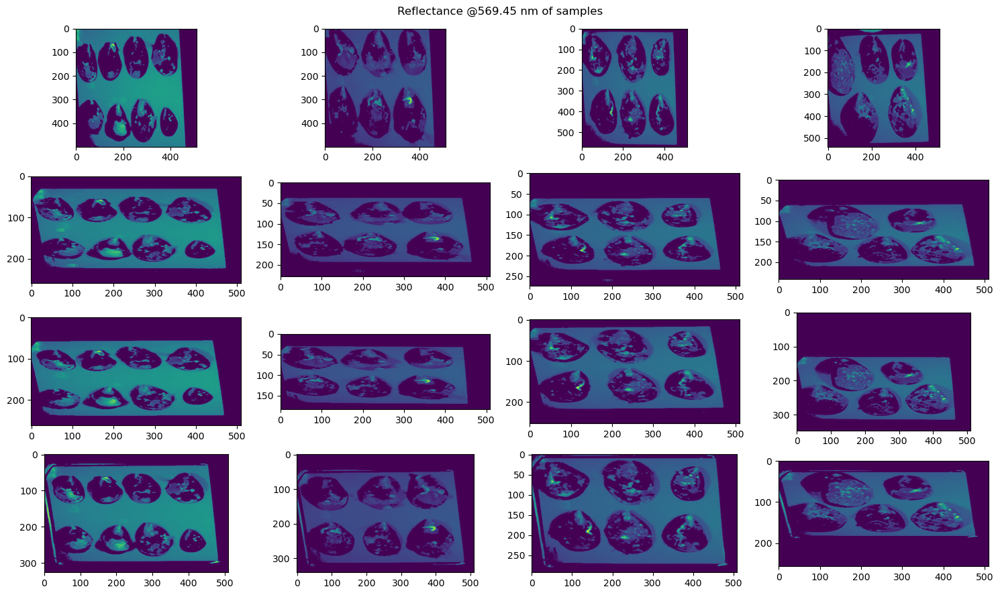

In [82]:
band = 100 # R-PE 569 nm
# band = 150 # Chl 655 nm

fig, axs = plt.subplots(4,4, sharex=False, sharey=False, figsize=(15,9))
fig.suptitle('Reflectance @' + str(wvl[band]) + ' nm of samples')

axs[0,0].imshow(sample_dict['-FC-_UW-Small-Tray01-Time01'][100:600,:, band])
axs[0,1].imshow(sample_dict['-FC-_UW-Med-Tray01-Time01'][150:650,:, band])
axs[0,2].imshow(sample_dict['-FC-_UW-Med-Tray02-Time01'][200:770,:, band])
axs[0,3].imshow(sample_dict['-FC-_UW-Large-Tray01-Time01'][250:790,:, band])

axs[1,0].imshow(sample_dict['-FC-_UW-Small-Tray03-Time02'][..., band])
axs[1,1].imshow(sample_dict['-FC-_UW-Med-Tray01-Time02'][..., band])
axs[1,2].imshow(sample_dict['-FC-_UW-Med-Tray02-Time02'][..., band])
axs[1,3].imshow(sample_dict['-FC-_UW-Large-Tray01-Time02'][..., band])

axs[2,0].imshow(sample_dict['S-Tray03-Time03_-FC-'][..., band])
axs[2,1].imshow(sample_dict['M-Tray01-Time03_-FC-'][..., band])
axs[2,2].imshow(sample_dict['S-Tray02-Time03_-FC-'][..., band])
axs[2,3].imshow(sample_dict['L-Tray01-Time03_-FC-'][..., band])

axs[3,0].imshow(sample_dict['S-Tray03-T04'][..., band])
axs[3,1].imshow(sample_dict['M-Tray01-T04'][..., band])
axs[3,2].imshow(sample_dict['M-Tray02-T04'][..., band])
axs[3,3].imshow(sample_dict['L-Tray01-T04'][..., band])

plt.subplots_adjust(left=0.00001, bottom=0.00001, wspace=0.00001, hspace=0.00001)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

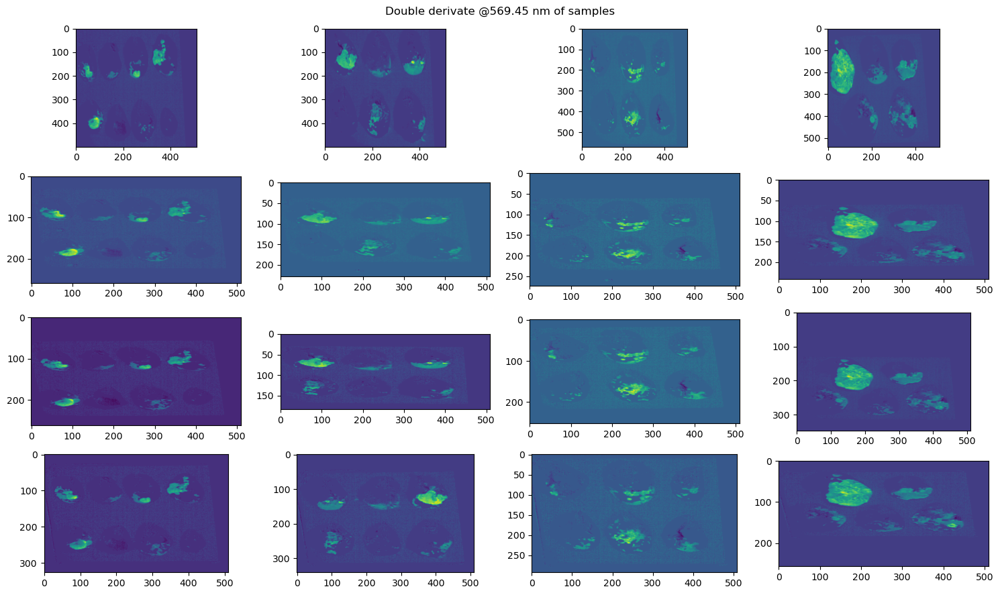

In [84]:
fig, axs = plt.subplots(4,4, sharex=False, sharey=False, figsize=(15,9))
fig.suptitle('Double derivate @' + str(wvl[band]) + ' nm of samples')

axs[0,0].imshow(dd_dict['-FC-_UW-Small-Tray01-Time01'][100:600,:, band])
axs[0,1].imshow(dd_dict['-FC-_UW-Med-Tray01-Time01'][150:650,:, band])
axs[0,2].imshow(dd_dict['-FC-_UW-Med-Tray02-Time01'][200:770,:, band])
axs[0,3].imshow(dd_dict['-FC-_UW-Large-Tray01-Time01'][250:790,:, band])

axs[1,0].imshow(dd_dict['-FC-_UW-Small-Tray03-Time02'][..., band])
axs[1,1].imshow(dd_dict['-FC-_UW-Med-Tray01-Time02'][..., band])
axs[1,2].imshow(dd_dict['-FC-_UW-Med-Tray02-Time02'][..., band])
axs[1,3].imshow(dd_dict['-FC-_UW-Large-Tray01-Time02'][..., band])

axs[2,0].imshow(dd_dict['S-Tray03-Time03_-FC-'][..., band])
axs[2,1].imshow(dd_dict['M-Tray01-Time03_-FC-'][..., band])
axs[2,2].imshow(dd_dict['S-Tray02-Time03_-FC-'][..., band])
axs[2,3].imshow(dd_dict['L-Tray01-Time03_-FC-'][..., band])

axs[3,0].imshow(dd_dict['S-Tray03-T04'][..., band])
axs[3,1].imshow(dd_dict['M-Tray01-T04'][..., band])
axs[3,2].imshow(dd_dict['M-Tray02-T04'][..., band])
axs[3,3].imshow(dd_dict['L-Tray01-T04'][..., band])

plt.subplots_adjust(left=0.00001, bottom=0.00001, wspace=0.00001, hspace=0.00001)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

## Experiment 3 - Grazer Arenas

In [85]:
# Files path
files_path = Path(r"C:\Users\jcmontes\OneDrive - University of Tasmania\01_Projects_Drive\UHI_Tank\data\JCMH-FC-Reflectance")

#Files Live-Epibiota-Shells
f3_path = files_path / 'T3-Grazer-Arenas'

# Reflectance images
hdr_list = list(f3_path.glob('*.hdr'))
bin_list = list(f3_path.glob('*.img'))

# List of files
targets = list(zip(hdr_list,bin_list))

In [149]:
sample_key = [] # Empty list for sample names (strings)
sample_dict = {} # Empty dict for Original Reflectance data cubes (np.ndarray)
dd_dict = {}
map_dict = {} # Pigment map dictionary (2D arrays with same Y & X dims as samples) - The canvas

# Begin
for i, sample in enumerate(tqdm(targets)):
    sample_key.append(sample[0].stem[20:-12])
    print(sample_key[i])
    target_open = sp.envi.open(sample[0], sample[1])
    target_data = target_open.load()
    
    # Build dictionaries - Reflectance and Derivatives
    sample_dict[sample_key[i]] = ss.savgol_filter(target_data[:,:,3:238], 3, 1, axis=2).copy()
    dd_dict[sample_key[i]] = ss.savgol_filter(target_data[:,:,3:238], 15, 3, axis=2, deriv=2).copy()
    
    # Adjust the arrays to specific dimensions with only the targets 
    # sample_dict[sample_key[i]] = sample_dict[sample_key[i]][sample_dims[i][0][0]:sample_dims[i][0][1], 
    #                                                         sample_dims[i][1][0]:sample_dims[i][1][1], :].copy()
    # dd_dict[sample_key[i]] = dd_dict[sample_key[i]][sample_dims[i][0][0]:sample_dims[i][0][1], sample_dims[i][1][0]:sample_dims[i][1][1], :].copy()
    map_dict[sample_key[i]] = np.empty((sample_dict[sample_key[i]].shape[0], sample_dict[sample_key[i]].shape[1], 1), dtype=np.float64)
    
    # Masking
    mask = sample_dict[sample_key[i]][:,:,135] < 0.07 # 800 nm threshold
    sample_m = sample_dict[sample_key[i]].copy() # Copy array
    sample_m[mask] = 0 # Apply mask
    sample_dict[sample_key[i]] = sample_m.copy() # Save
    
    sample_mdd = dd_dict[sample_key[i]].copy()
    sample_mdd[mask] = 0 # Apply mask on dd array
    dd_dict[sample_key[i]] = sample_mdd.copy()

# Save wavelengths
wvl = [float(i) for i in target_open.metadata['wavelength'][3:238]]

  0%|          | 0/33 [00:00<?, ?it/s]

Grazer1-T0
Grazer2-T0
Grazer2-T1
Grazer2-T1-2
Grazer1-T1
Grazer1-T1-2
Grazer2-T2
Grazer2-T2-2
Grazer1-T2
Grazer1-T2
Grazer1-T2-2
Grazer1-T3
Grazer1-T3-2
Grazer1-T3
Grazer1-T3-2
Grazer2-T3
Grazer2-T3-2
Grazer2-T4
Grazer2-T4-2
Grazer1-T4
Grazer1-T4-2
Grazer1-T5-2
Grazer1-T5-2--2
Grazer2-T5
Grazer2-T5-2
Grazer2-T6
Grazer2-T6-2
Grazer1-T6
Grazer1-T6-2
Grazer1-T7
Grazer1-T7-2
Grazer2-T7
Grazer2-T7-2


In [176]:
wvl[71]

519.84

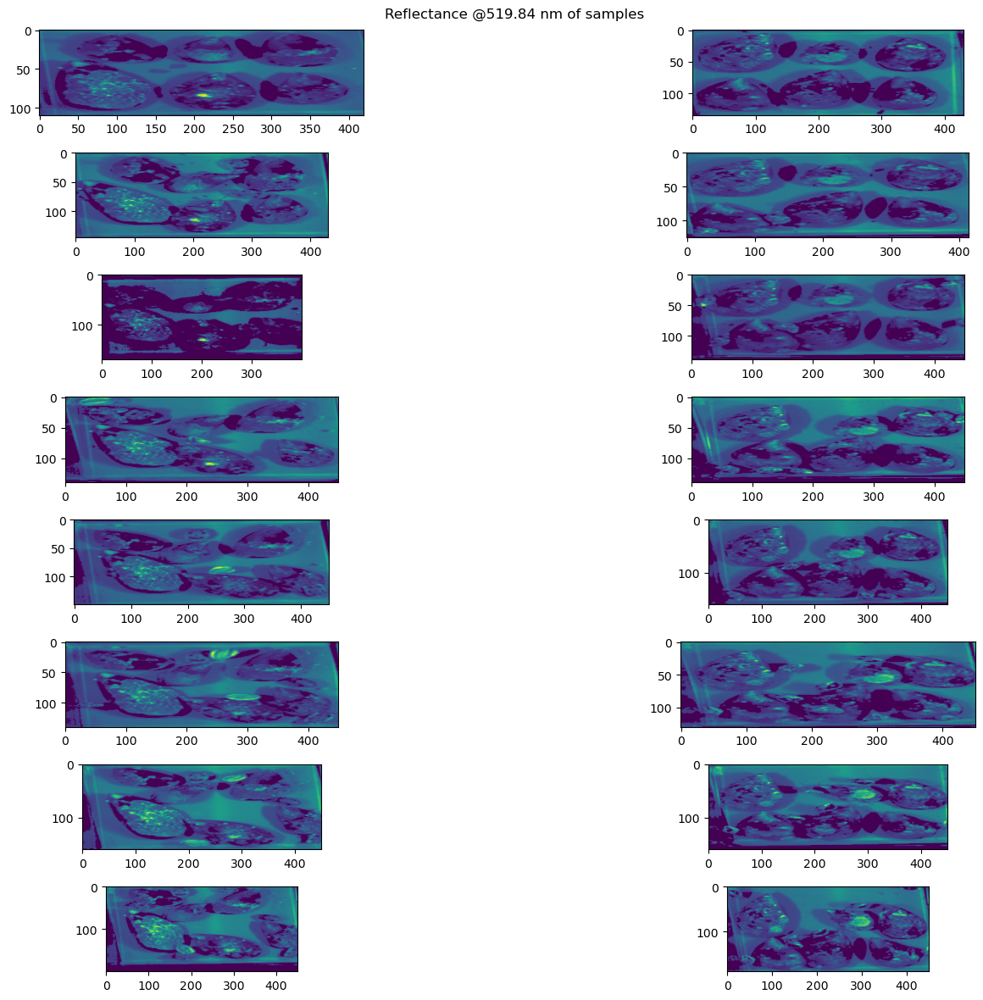

In [177]:
# band = 59 # R-PE 499 nm
# band = 100 # R-PE 569 nm
# band = 150 # Chl 655 nm
# band = 162 # Chl 676 nm
# band = 42 # Sponges 470 nm
band = 71 # Cyanobacteria

fig, axs = plt.subplots(8,2, sharex=False, sharey=False, figsize=(18,12))
fig.suptitle('Reflectance @' + str(wvl[band]) + ' nm of samples')

axs[0,0].imshow(sample_dict['Grazer1-T0'][10:120,30:450, band])
axs[0,1].imshow(sample_dict['Grazer2-T0'][15:150,20:450, band])

axs[1,0].imshow(sample_dict['Grazer1-T1'][90:235,20:450, band])
axs[1,1].imshow(sample_dict['Grazer2-T1'][65:190,35:450, band])

axs[2,0].imshow(sample_dict['Grazer1-T2'][120:290,50:450, band])
axs[2,1].imshow(sample_dict['Grazer2-T2'][80:220,:450, band])

axs[3,0].imshow(sample_dict['Grazer1-T3'][40:180,:450, band])
axs[3,1].imshow(sample_dict['Grazer2-T3'][60:200,:450, band])

axs[4,0].imshow(sample_dict['Grazer1-T4'][20:170,:450, band])
axs[4,1].imshow(sample_dict['Grazer2-T4'][60:220,:450, band])

axs[5,0].imshow(sample_dict['Grazer1-T5-2'][60:200,:450, band])
axs[5,1].imshow(sample_dict['Grazer2-T5'][70:200,:450, band])

axs[6,0].imshow(sample_dict['Grazer1-T6'][65:225,:450, band])
axs[6,1].imshow(sample_dict['Grazer2-T6'][100:260,:450, band])

axs[7,0].imshow(sample_dict['Grazer1-T7'][50:250,:450, band])
axs[7,1].imshow(sample_dict['Grazer2-T7'][70:260,:450, band])

plt.subplots_adjust(left=0.2, bottom=0.01, wspace=0.01, hspace=0.7)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

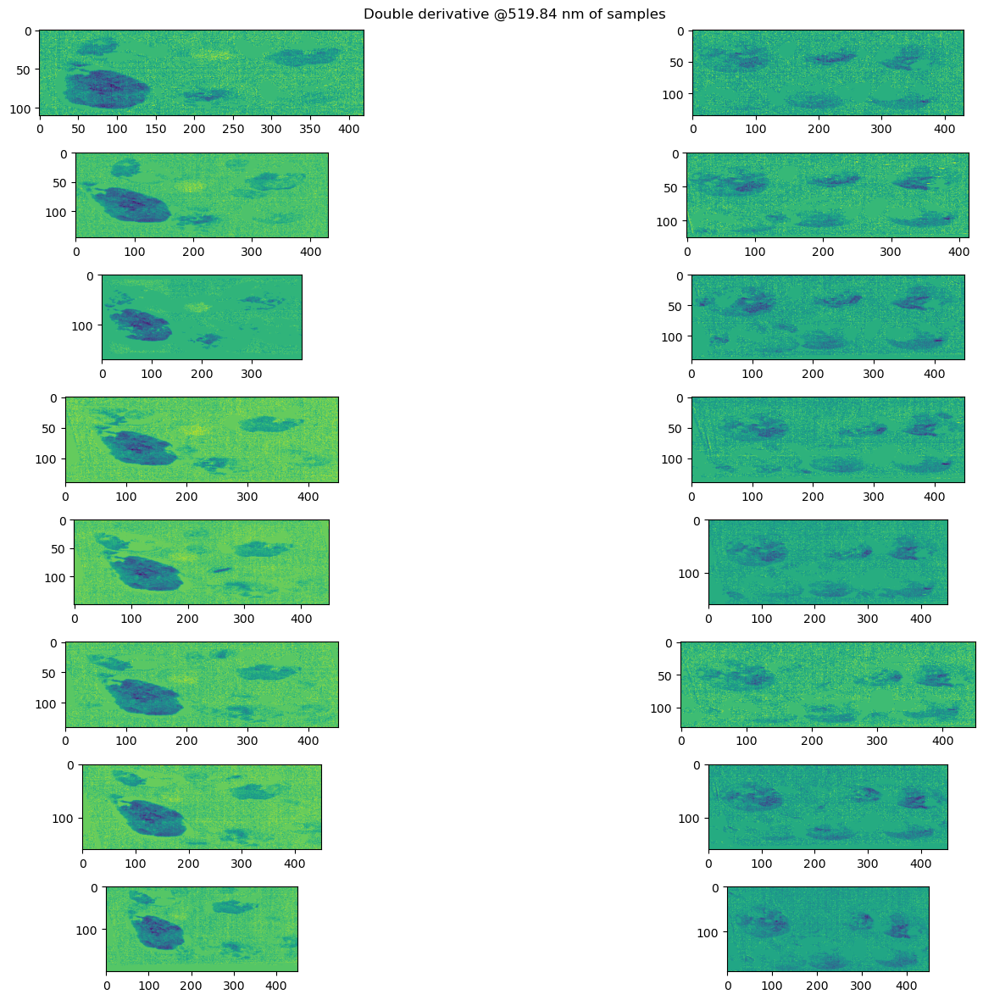

In [189]:
fig, axs = plt.subplots(8,2, sharex=False, sharey=False, figsize=(18,12))
fig.suptitle('Double derivative @' + str(wvl[band]) + ' nm of samples')

axs[0,0].imshow(dd_dict['Grazer1-T0'][10:120,30:450, band], vmin=-0.001252, vmax=0.0006)
axs[0,1].imshow(dd_dict['Grazer2-T0'][15:150,20:450, band])

axs[1,0].imshow(dd_dict['Grazer1-T1'][90:235,20:450, band])
axs[1,1].imshow(dd_dict['Grazer2-T1'][65:190,35:450, band])

axs[2,0].imshow(dd_dict['Grazer1-T2'][120:290,50:450, band])
axs[2,1].imshow(dd_dict['Grazer2-T2'][80:220,:450, band])

axs[3,0].imshow(dd_dict['Grazer1-T3'][40:180,:450, band])
axs[3,1].imshow(dd_dict['Grazer2-T3'][60:200,:450, band])

axs[4,0].imshow(dd_dict['Grazer1-T4'][20:170,:450, band])
axs[4,1].imshow(dd_dict['Grazer2-T4'][60:220,:450, band])

axs[5,0].imshow(dd_dict['Grazer1-T5-2'][60:200,:450, band])
axs[5,1].imshow(dd_dict['Grazer2-T5'][70:200,:450, band])

axs[6,0].imshow(dd_dict['Grazer1-T6'][65:225,:450, band])
axs[6,1].imshow(dd_dict['Grazer2-T6'][100:260,:450, band])

axs[7,0].imshow(dd_dict['Grazer1-T7'][50:250,:450, band])
axs[7,1].imshow(dd_dict['Grazer2-T7'][70:260,:450, band])

plt.subplots_adjust(left=0.2, bottom=0.01, wspace=0.01, hspace=0.7)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

## Experiment 4 - Dry CCA after 7 days in Sillica gel

In [190]:
# Files path
files_path = Path(r"C:\Users\jcmontes\OneDrive - University of Tasmania\01_Projects_Drive\UHI_Tank\data\JCMH-FC-Reflectance")

#Files Live-Epibiota-Shells
f4_path = files_path / 'T4-Dry-Epibiota-Shells'

# Reflectance images
hdr_list = list(f4_path.glob('*.hdr'))
bin_list = list(f4_path.glob('*.img'))

# List of files
targets = list(zip(hdr_list,bin_list))

In [192]:
sample_key = [] # Empty list for sample names (strings)
sample_dict = {} # Empty dict for Original Reflectance data cubes (np.ndarray)
dd_dict = {}
map_dict = {} # Pigment map dictionary (2D arrays with same Y & X dims as samples) - The canvas

# Begin
for i, sample in enumerate(tqdm(targets)):
    sample_key.append(sample[0].stem[20:-12])
    print(sample_key[i])
    target_open = sp.envi.open(sample[0], sample[1])
    target_data = target_open.load()
    
    # Build dictionaries - Reflectance and Derivatives
    sample_dict[sample_key[i]] = ss.savgol_filter(target_data[:,:,3:238], 3, 1, axis=2).copy()
    dd_dict[sample_key[i]] = ss.savgol_filter(target_data[:,:,3:238], 15, 3, axis=2, deriv=2).copy()
    
    # Adjust the arrays to specific dimensions with only the targets 
    # sample_dict[sample_key[i]] = sample_dict[sample_key[i]][sample_dims[i][0][0]:sample_dims[i][0][1], 
    #                                                         sample_dims[i][1][0]:sample_dims[i][1][1], :].copy()
    # dd_dict[sample_key[i]] = dd_dict[sample_key[i]][sample_dims[i][0][0]:sample_dims[i][0][1], sample_dims[i][1][0]:sample_dims[i][1][1], :].copy()
    map_dict[sample_key[i]] = np.empty((sample_dict[sample_key[i]].shape[0], sample_dict[sample_key[i]].shape[1], 1), dtype=np.float64)
    
    # Masking
    mask = sample_dict[sample_key[i]][:,:,135] < 0.1 # 630 nm threshold
    sample_m = sample_dict[sample_key[i]].copy() # Copy array
    sample_m[mask] = 0 # Apply mask
    sample_dict[sample_key[i]] = sample_m.copy() # Save
    
    sample_mdd = dd_dict[sample_key[i]].copy()
    sample_mdd[mask] = 0 # Apply mask on dd array
    dd_dict[sample_key[i]] = sample_mdd.copy()

# Save wavelengths
wvl = [float(i) for i in target_open.metadata['wavelength'][3:238]]

  0%|          | 0/7 [00:00<?, ?it/s]

Dry-M-3
Dry-L-2
Dry-L-1
Dry-L-3
Dry-L-4
Dry-S-1
Dry-S-2


In [176]:
wvl[71]

519.84

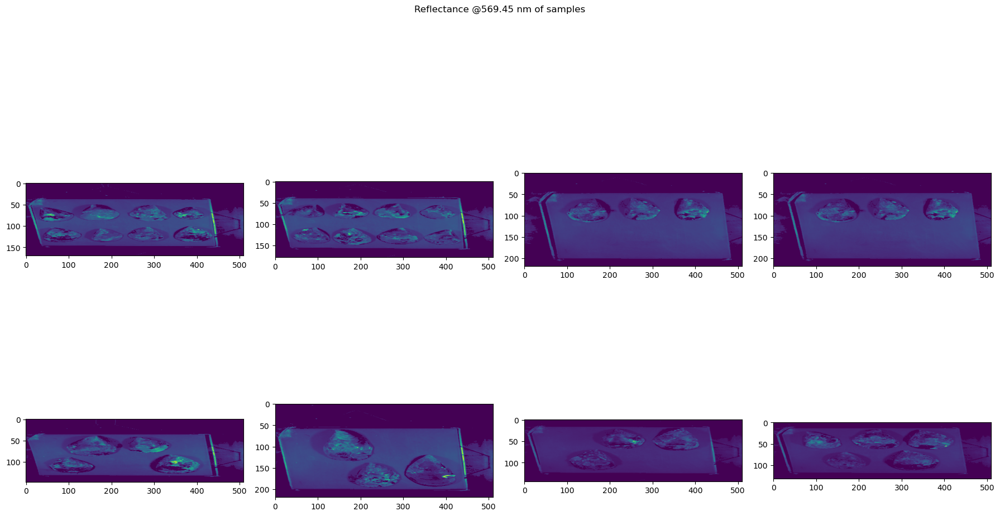

In [205]:
band = 100 # R-PE 569 nm

fig, axs = plt.subplots(2,4, sharex=False, sharey=False, figsize=(18,12))
fig.suptitle('Reflectance @' + str(wvl[band]) + ' nm of samples')

axs[0,0].imshow(sample_dict['Dry-S-1'][:,:, band])
axs[0,1].imshow(sample_dict['Dry-S-2'][:,:, band])
axs[0,2].imshow(sample_dict['Dry-M-3'][:,:, band])
axs[0,3].imshow(sample_dict['Dry-M-3'][:,:, band])

axs[1,0].imshow(sample_dict['Dry-L-1'][:,:, band])
axs[1,1].imshow(sample_dict['Dry-L-2'][:,:, band])
axs[1,2].imshow(sample_dict['Dry-L-3'][:,:, band])
axs[1,3].imshow(sample_dict['Dry-L-4'][:,:, band])

plt.subplots_adjust(left=-0.1, bottom=-0.01, wspace=-0.01, hspace=0.01)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

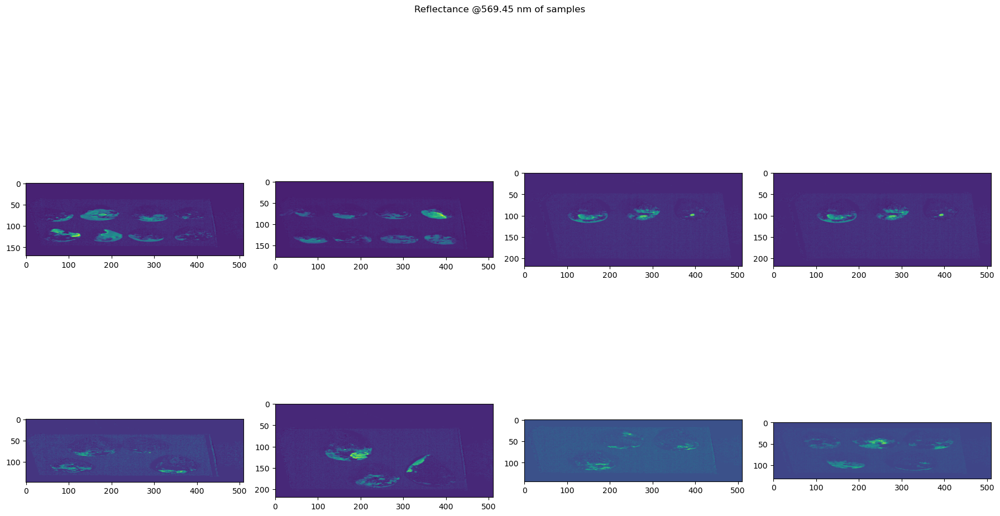

In [206]:
band = 100 # R-PE 569 nm


fig, axs = plt.subplots(2,4, sharex=False, sharey=False, figsize=(18,12))
fig.suptitle('Reflectance @' + str(wvl[band]) + ' nm of samples')

axs[0,0].imshow(dd_dict['Dry-S-1'][:,:, band])
axs[0,1].imshow(dd_dict['Dry-S-2'][:,:, band])
axs[0,2].imshow(dd_dict['Dry-M-3'][:,:, band])
axs[0,3].imshow(dd_dict['Dry-M-3'][:,:, band])

axs[1,0].imshow(dd_dict['Dry-L-1'][:,:, band])
axs[1,1].imshow(dd_dict['Dry-L-2'][:,:, band])
axs[1,2].imshow(dd_dict['Dry-L-3'][:,:, band])
axs[1,3].imshow(dd_dict['Dry-L-4'][:,:, band])

plt.subplots_adjust(left=-0.1, bottom=-0.01, wspace=-0.01, hspace=0.01)
plt.tight_layout()
# plt.savefig(out_p + 'NIR-Reflectance-All-Samples.png', dpi=600)
plt.show()

In [156]:
wvl[59]

499.38

In [188]:
dd_dict['Grazer1-T0'][10:120,30:450, band].min()

-0.0012526112

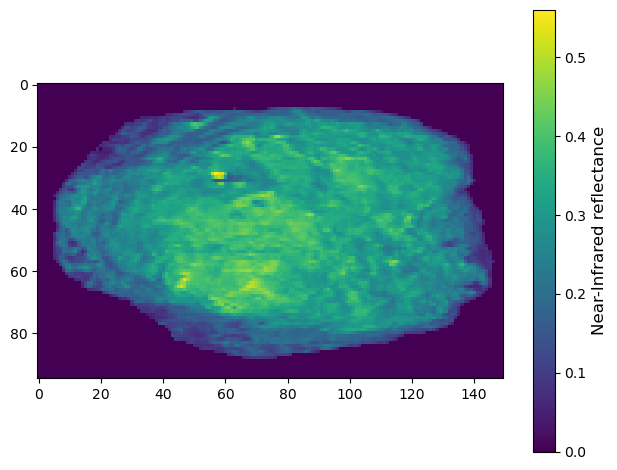

In [187]:
# plt.imshow(sample_dict['GHN-03'][...,173], interpolation='none', norm=None, cmap='viridis')
# # plt.title(sample_key[i] + ' R-Phycoerythrin - δ 563 nm', fontsize=15)
# cbar = plt.colorbar()
# cbar.set_label('Near-Infrared reflectance', fontsize=12, rotation=90)
# plt.tight_layout()
# plt.savefig(out_p + 'for_colorbar.png', dpi=600)
# plt.show()
# plt.close()

C:\Users\jcmontes\AppData\Local\Temp\ipykernel_3288\2864920706.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
C:\Users\jcmontes\AppData\Local\Temp\ipykernel_3288\2864920706.py:30: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


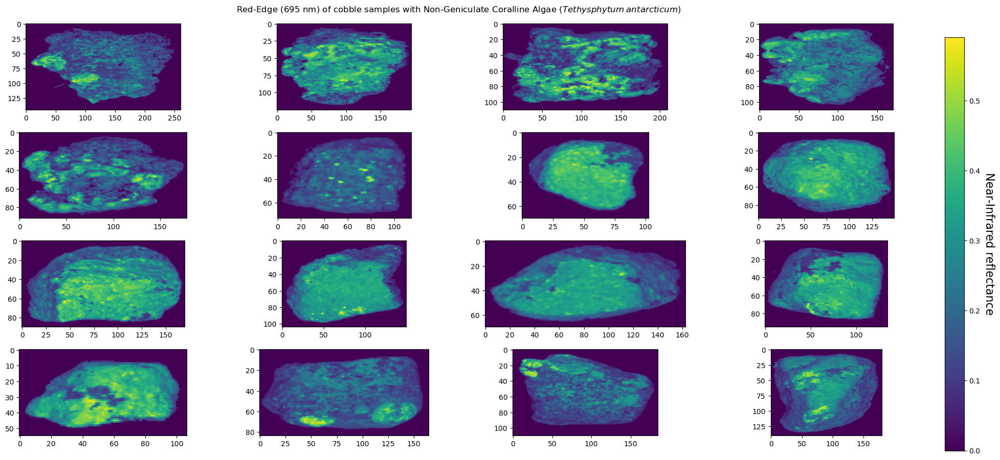

In [174]:
# Chat GPT version
samples = ['CE-01_', 'CE-02_', 'CE-03_', 'CE-04_', 'CE-05_', 'GHN-01', 'GHN-02', 'GHN-03', 'GHN-04',
           'GHN-05', 'GHN-06', 'GHN-07', 'GHN-08', 'GHS-01', 'GHS-02', 'GHS-03']

fig, axs = plt.subplots(4, 4, sharex=False, sharey=False, figsize=(19, 9))
fig.suptitle('Red-Edge (695 nm) of cobble samples with Non-Geniculate Coralline Algae ($Tethysphytum _ antarcticum $)')

im_list = []
for i, sample in enumerate(samples):
    row, col = divmod(i, 4) #unknown function
    im = axs[row, col].imshow(sample_dict[sample][...,173])
    im_list.append(im)

fig.subplots_adjust(left=0.00001, right=0.00009, bottom=0.000001, top=0.00001, wspace=0.00005, hspace=0.00005)

# Create ScalarMappable object
cmap = plt.get_cmap("viridis")
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array([])

# Add colorbar
cbar_ax = fig.add_axes([1.0, 0.01, 0.02, 0.9])
cbar = plt.colorbar(im_list[0], cax=cbar_ax, orientation='vertical')
cbar.set_label('Near-Infrared reflectance', fontsize=16, verticalalignment='bottom', rotation=-90)

fig.tight_layout()
fig.canvas.draw()

plt.savefig(out_p + 'NIR-Reflectance-All-Samples2.png', dpi=600)
fig.show()

In [9]:
# # Read results from Linear-Mixed-Models, sort by R2
# tables_path = Path(r"C:\Users\jcmontes\OneDrive - University of Tasmania\01_Projects_Drive\Imaging_spectroscopy\Phenotyping_macroalgae\results\Hyperspectral_Imaging\res_tables")

# pe_lmm = pd.read_csv(tables_path / "PE-LMM.csv", sep=" ")
# pe_lmm = pe_lmm.T
# pe_lmm = pe_lmm.sort_values('R2', ascending=False).copy()

# print(pe_lmm.shape)
# pe_lmm.head(5)

<center> Table 1. Effective Linear-Mixed-Models for Pigment Content </center>

| **Index type**             | **λ1** | **λ2 (or Δ)** | **Slope** | **Intercept** | **R^2^**  |
| ---| -- | ---| ---| ---| --- | 
| **R-Phycoerythrin (R-PE)** |        |               |           |               |           |
| \- δλ                   | 563    | \-            | 33.33275  | 0.04088       | **0.718** |
| \- δδλ | 563 | - | 57.24781 | 0.02675 | 0.702 |
| \- δδλ                   | 569    | \-            | 37.94613  | 0.02038       | **0.696** |
| \- ANMB_[λ1,λ2]       | 563    | 20Δ           | 0.06631   | 0.02692       | **0.677** |
| **Chlorophyll**            |        |               |           |               |           |
| \- ANMB_[λ1,λ2]       | 434    | 40Δ           | -5.55396  | 17.70849      | **0.432** |
| **Phaeophytin**            |        |               |           |               |           |
| \- Rλ                    | 624    | \-            | 49.12958  | -6.46481      | **0.337** |


## Select sample

In [10]:
import random

In [13]:
i = 7
# i = random.randint(0,16)
i

7

In [14]:
#Output path
out_p = r"C:\Users\jcmontes\OneDrive - University of Tasmania\01_Projects_Drive\Imaging_spectroscopy\Phenotyping_macroalgae\results\Hyperspectral_Imaging\Sample-Pigment-Maps/"

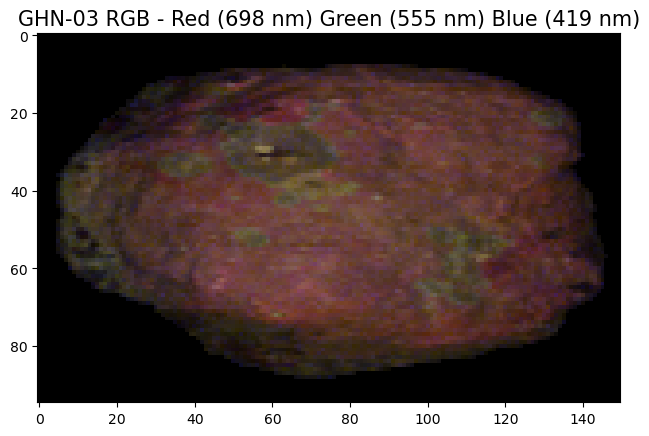

In [17]:
sample = sample_dict[sample_key[i]]

plt.imshow(sample[:,:,(175,92,12)])
plt.title(sample_key[i] + ' RGB - Red (698 nm) Green (555 nm) Blue (419 nm)', fontsize=15)
plt.tight_layout()
# plt.savefig(out_p + sample_key[i] + '-RGB.png', dpi=600)
plt.show()
plt.close()

## R-Phycoerythrin maps

In [18]:
#d563
pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

for y in range(0, sample.shape[0]):
    for x in range(0, sample.shape[1]):
        if sample[y,x].any() == 0:
            pigment_map[y,x] = 0
        else:
            first_d = ss.savgol_filter(sample[y,x], 15, 3, deriv=1)
            pigment_map[y,x] = 0.04088 + (33.33275 * first_d[96]) # d 563 nm

d563_map = pigment_map.copy()

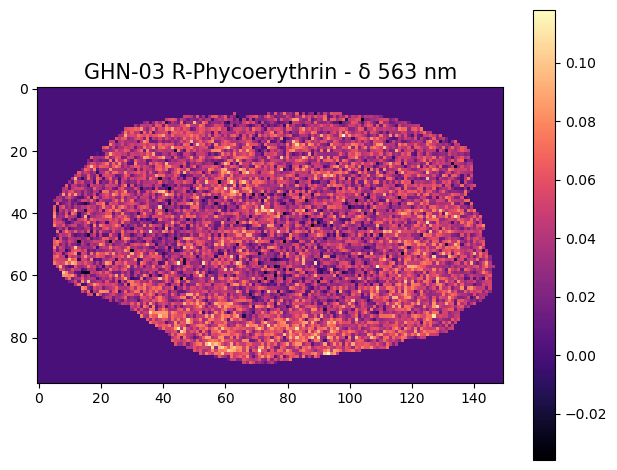

In [19]:
plt.imshow(d563_map, interpolation='none', norm=None, cmap='magma')
plt.title(sample_key[i] + ' R-Phycoerythrin - δ 563 nm', fontsize=15)
plt.colorbar()
plt.tight_layout()
# plt.savefig(out_p + sample_key[i] + '-d563_map.png', dpi=600)
plt.show()
plt.close()

In [20]:
# #dd563
sample = sample_dict[sample_key[i]]
pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

for y in range(0, sample.shape[0]):
    for x in range(0, sample.shape[1]):
        if sample[y,x].any() == 0:
            pigment_map[y,x] = 0
        else:
            second_d = ss.savgol_filter(sample[y,x], 15, 3, deriv=2)
            pigment_map[y,x] = 0.02675 + (57.24781 * second_d[96]) # dd563 nm

dd563_map = pigment_map.copy()

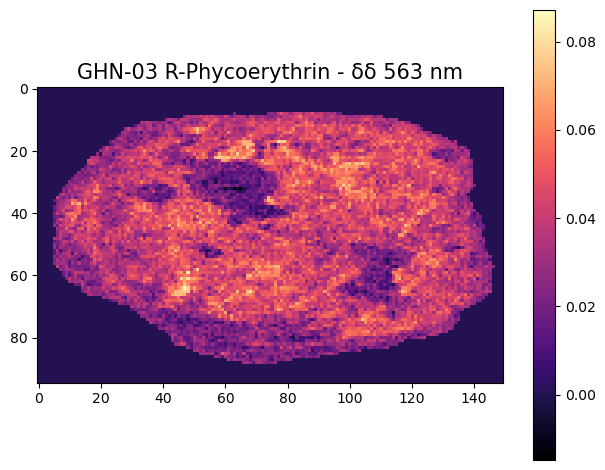

In [21]:
plt.imshow(dd563_map, interpolation='none', norm=None, cmap='magma')
plt.title(sample_key[i] + ' R-Phycoerythrin - δδ 563 nm', fontsize=15)
plt.colorbar()
plt.tight_layout()
# plt.savefig(out_p + sample_key[i] + '-d563_map.png', dpi=600)
plt.show()
plt.close()

In [22]:
#dd569
sample = sample_dict[sample_key[i]]
pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

for y in range(0, sample.shape[0]):
    for x in range(0, sample.shape[1]):
        if sample[y,x].any() == 0:
            pigment_map[y,x] = 0
        else:
            second_d = ss.savgol_filter(sample[y,x], 15, 3, deriv=2)
            pigment_map[y,x] = 0.02038 + (37.94613689 * second_d[100]) # dd 569 nm
            
dd569_map = pigment_map.copy()

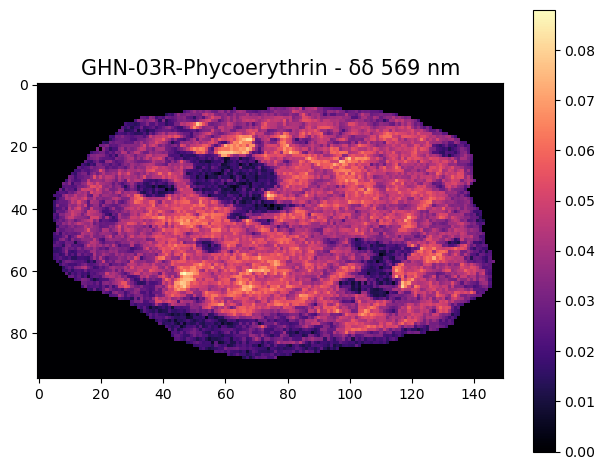

In [23]:
plt.imshow(dd569_map, interpolation='none', norm=None, cmap='magma')
plt.title(sample_key[i] + 'R-Phycoerythrin - δδ 569 nm', fontsize=15)
plt.colorbar()
plt.tight_layout()
# plt.savefig(out_p + sample_key[i] + '-dd569_map.png', dpi=600)
plt.show()
plt.close()

In [96]:
## dd494
# sample = sample_dict[sample_key[i]]
# pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

# for y in range(0, sample.shape[0]):
#     for x in range(0, sample.shape[1]):
#         if sample[y,x].any() == 0:
#             pigment_map[y,x] = 0
#         else:
#             second_d = ss.savgol_filter(sample[y,x], 25, 3, deriv=2)
#             pigment_map[y,x] = 0.02683 + (52.58285 * second_d[56]) # dd 494 nm

# dd494_map = pigment_map.copy()

In [97]:
# plt.imshow(dd494_map, cmap='magma')
# plt.show()

In [112]:
## ANMB 563_20
sample = sample_dict[sample_key[i]]
pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

# ANMB maps
for y in range(0, sample.shape[0]):
    for x in range(0, sample.shape[1]):
        if sample[y,x].any() == 0:
            pigment_map[y,x] = 0
        else:
            # sav_gol_filter = ss.savgol_filter(sample[y,x][88:113], 3, 1)
            region = sample[y,x][90:103]
            # pre_continuum = sav_gol_filter.tolist()
            pre_continuum = region.tolist()
            bands = list(wvl[90:103]) # Select bands (PE563, 88:113), CHL [12:36]
            conv_h_q = spectro.FeaturesConvexHullQuotient(pre_continuum, bands, baseline=0.9999)
            auc = conv_h_q.get_area(feat_no=1)
            mbd = conv_h_q.get_absorbtion_depth(feat_no=1)
            anmb = auc/mbd
            
            pigment_map[y,x] = 0.02692 + (0.06631 * anmb) # ANMB 563 nm 

anmb563_map = pigment_map.copy()

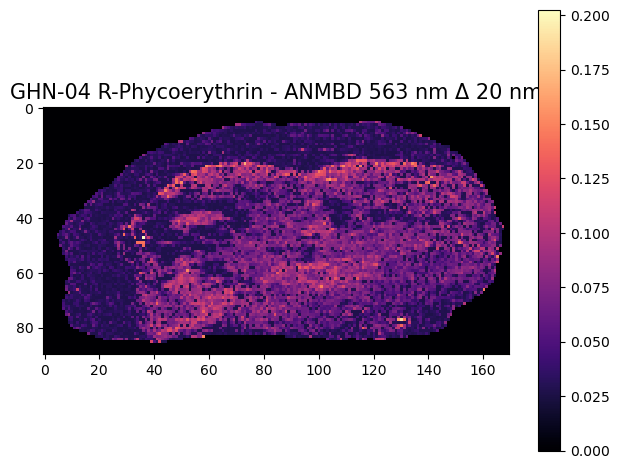

In [114]:
plt.imshow(anmb563_map, interpolation='none', norm=None, cmap='magma')
plt.title(sample_key[i] + ' R-Phycoerythrin - ANMBD 563 nm Δ 20 nm', fontsize=15)
plt.colorbar()
plt.tight_layout()
# plt.savefig(out_p + sample_key[i] + '-anmb563_map.png', dpi=600)
plt.show()
plt.close()

In [116]:
wvl[132]

624.38

## Chlorophylls/Pheophytin maps

In [117]:
#R624
sample = sample_dict[sample_key[i]]
pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

for y in range(0, sample.shape[0]):
    for x in range(0, sample.shape[1]):
        if sample[y,x].any() == 0:
            pigment_map[y,x] = 0
        else:
            pigment_map[y,x] = -6.46481 + (49.12958 * sample[y,x,132]) # R624 nm

R624_map = pigment_map.copy()

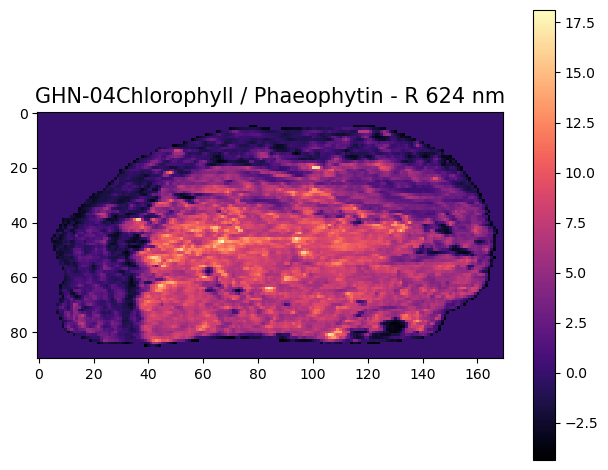

In [118]:
plt.imshow(R624_map, interpolation='none', norm=None, cmap='magma')
plt.title(sample_key[i] + 'Chlorophyll / Phaeophytin - R 624 nm', fontsize=15)
plt.colorbar()
plt.tight_layout()
# plt.savefig(out_p + sample_key[i] + '-R624_map.png', dpi=600)
plt.show()
plt.close()

In [119]:
# #R665
# sample = sample_dict[sample_key[i]]
# pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

# for y in range(0, sample.shape[0]):
#     for x in range(0, sample.shape[1]):
#         if sample[y,x].any() == 0:
#             pigment_map[y,x] = 0
#         else:
#             pigment_map[y,x] = -2.62970 + (47.60657 * sample[y,x,159]) # R665 nm

# R665_map = pigment_map.copy()

## Subplot Figures

### R-PE maps Figure

In [155]:
wvl[95]

560.89

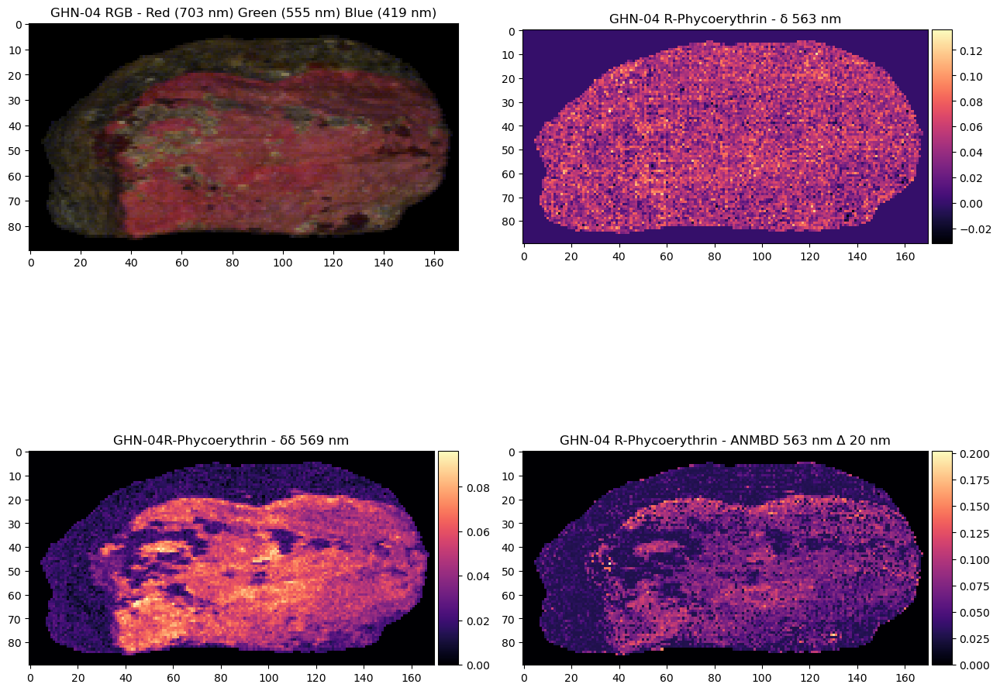

In [149]:
out_p = r"C:\Users\jcmontes\OneDrive - University of Tasmania\01_Projects_Drive\Imaging_spectroscopy\Phenotyping_macroalgae\results\Hyperspectral_Imaging\Sample-R-PE-Maps-Subplot"

fig, ((ax0,ax1), (ax2,ax3)) = plt.subplots(2,2, figsize=(13,13), squeeze=True)
# im0 = ax0.imshow(anmb563_map, interpolation='none', norm=None, cmap='magma')
plt.subplots_adjust(wspace=0, hspace=0)

ax0.imshow(sample[:,:,(178,95,15)])
ax0.title.set_text(sample_key[i] + ' RGB - Red (703 nm) Green (560 nm) Blue (424 nm)')

im1 = ax1.imshow(d563_map, cmap='magma')
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='vertical')
ax1.title.set_text(sample_key[i] + ' R-Phycoerythrin - δ 563 nm')

im2 = ax2.imshow(dd569_map, cmap='magma')
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical')
ax2.title.set_text(sample_key[i] + 'R-Phycoerythrin - δδ 569 nm')


im3 = ax3.imshow(anmb563_map, cmap='magma')
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im3, cax=cax, orientation='vertical')
ax3.title.set_text(sample_key[i] + ' R-Phycoerythrin - ANMBD 563 nm Δ 20 nm')

# plt.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
# fig.colorbar(im2, cax=cbar_ax)

plt.tight_layout()
# plt.savefig(out_p + sample_key[i] + '-R-PE_maps.png', dpi=600)
plt.show()

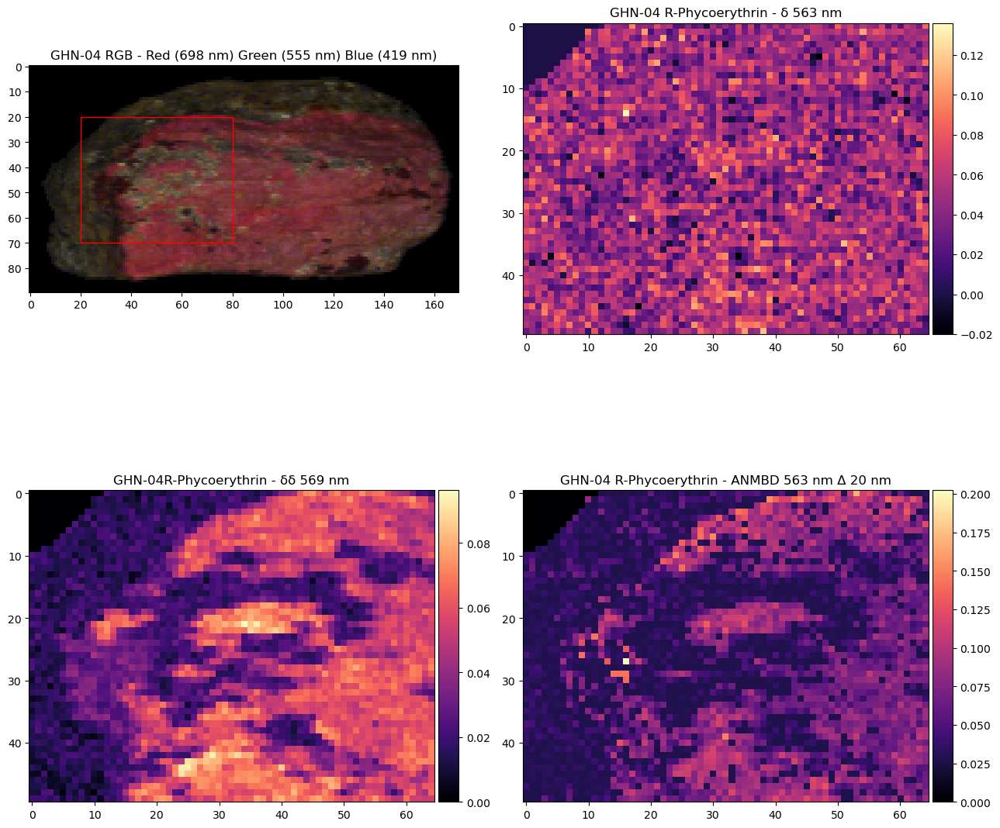

In [153]:
rect = patches.Rectangle((20, 20), 60, 50, linewidth=1, edgecolor='r', facecolor='none')
# rect = patches.Rectangle((random.randint(10, 30), random.randint(10, 30)), 40, 50, linewidth=1, edgecolor='r', facecolor='none')

# plt.rcParams["figure.autolayout"] = True

fig, ((ax0,ax1), (ax2,ax3)) = plt.subplots(2,2, figsize=(13,13), squeeze=True)
# im0 = ax0.imshow(anmb563_map, interpolation='none', norm=None, cmap='magma')
# plt.subplots_adjust(wspace=0, hspace=0)

ax0.imshow(sample[:,:,(178,95,15)])
ax0.title.set_text(sample_key[i] + ' RGB - Red (698 nm) Green (555 nm) Blue (419 nm)')
ax0.add_patch(rect)

im1 = ax1.imshow(d563_map[20:70,20:85], cmap='magma')
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='vertical')
ax1.title.set_text(sample_key[i] + ' R-Phycoerythrin - δ 563 nm')

im2 = ax2.imshow(dd569_map[20:70,20:85], cmap='magma')
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical')
ax2.title.set_text(sample_key[i] + 'R-Phycoerythrin - δδ 569 nm')


im3 = ax3.imshow(anmb563_map[20:70,20:85], cmap='magma')
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im3, cax=cax, orientation='vertical')
ax3.title.set_text(sample_key[i] + ' R-Phycoerythrin - ANMBD 563 nm Δ 20 nm')

# plt.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
# fig.colorbar(im2, cax=cbar_ax)

plt.tight_layout()
plt.show()

## Zoom R-PE vs Chlorophyll/Phaeophytin

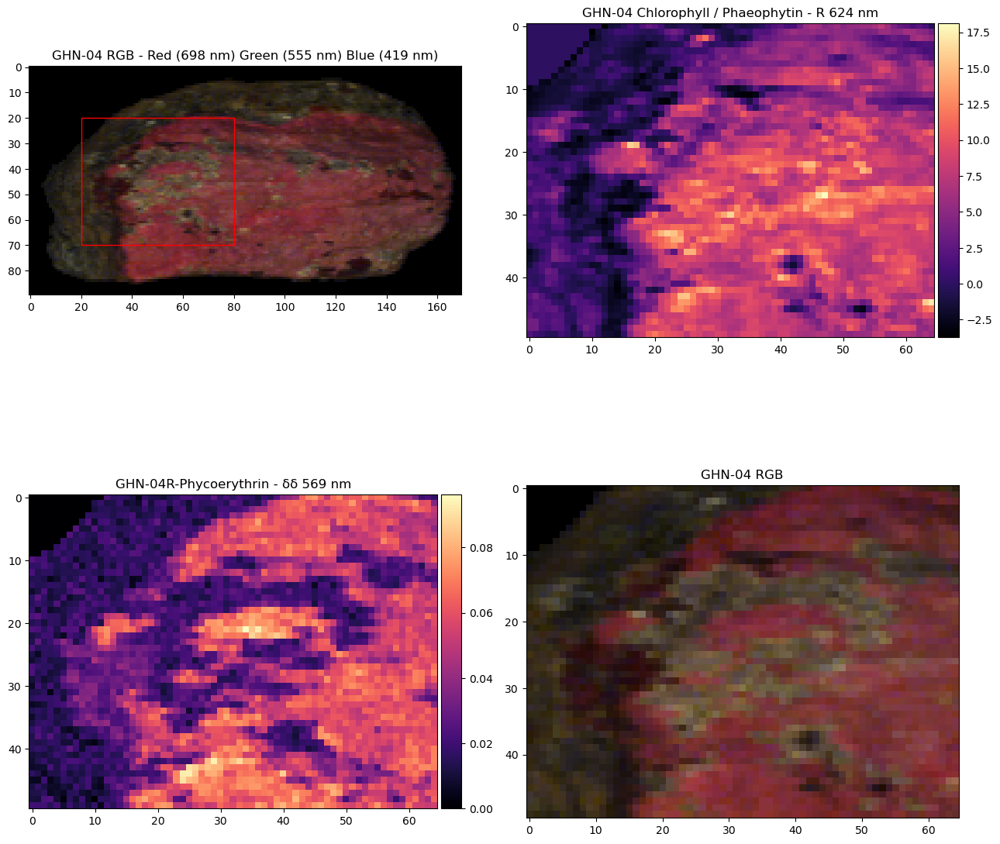

In [154]:
out_p = r"C:\Users\jcmontes\OneDrive - University of Tasmania\01_Projects_Drive\Imaging_spectroscopy\Phenotyping_macroalgae\results\Hyperspectral_Imaging\R-PEvsChl-Maps/"
rect = patches.Rectangle((20, 20), 60, 50, linewidth=1, edgecolor='r', facecolor='none')

# plt.rcParams["figure.autolayout"] = True

fig, ((ax0,ax1), (ax2,ax3)) = plt.subplots(2,2, figsize=(13,13), squeeze=True)
# im0 = ax0.imshow(anmb563_map, interpolation='none', norm=None, cmap='magma')
# plt.subplots_adjust(wspace=0, hspace=0)

ax0.imshow(sample[:,:,(178,95,15)])
ax0.title.set_text(sample_key[i] + ' RGB - Red (698 nm) Green (555 nm) Blue (419 nm)')
ax0.add_patch(rect)

im1 = ax1.imshow(R624_map[20:70,20:85], cmap='magma')
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='vertical')
ax1.title.set_text(sample_key[i] + ' Chlorophyll / Phaeophytin - R 624 nm')

im2 = ax2.imshow(dd569_map[20:70,20:85], cmap='magma')
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical')
ax2.title.set_text(sample_key[i] + 'R-Phycoerythrin - δδ 569 nm')


im3 = ax3.imshow(sample[20:70,20:85,(178,95,15)])
# divider = make_axes_locatable(ax3)
# cax = divider.append_axes('right', size='5%', pad=0.05)
# fig.colorbar(im3, cax=cax, orientation='vertical')
ax3.title.set_text(sample_key[i] + ' RGB')

# plt.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
# fig.colorbar(im2, cax=cbar_ax)

plt.tight_layout()
plt.show()

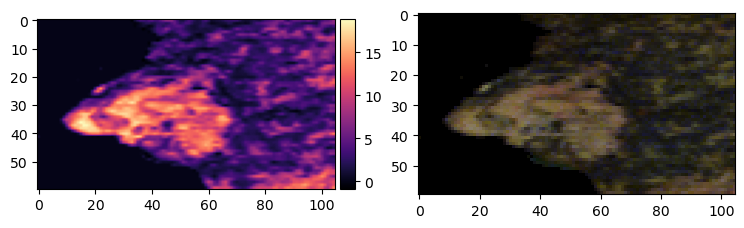

In [38]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(9,9))
# im0 = ax0.imshow(anmb563_map, interpolation='none', norm=None, cmap='magma')
im0 = ax0.imshow(R665_map[30:90,:105], cmap='magma')

divider = make_axes_locatable(ax0)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im0, cax=cax, orientation='vertical')

ax1.imshow(sample[30:90,:105,(178,95,15)])

plt.show()

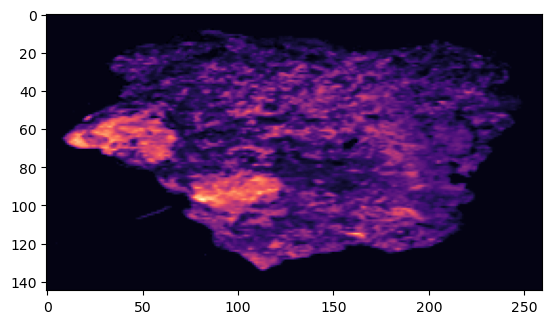

In [39]:
plt.imshow(R665_map, cmap='magma')
plt.show()

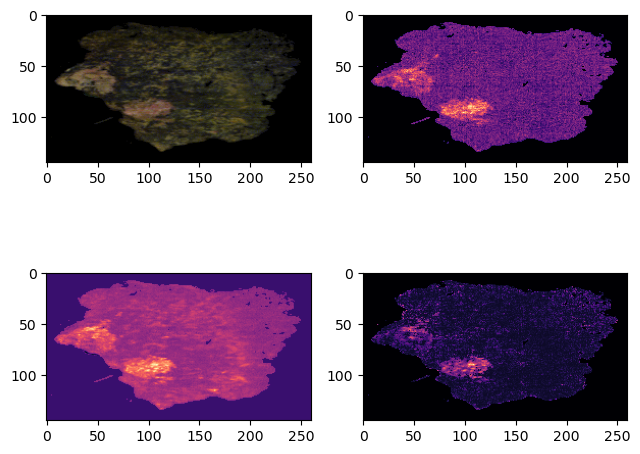

In [40]:
# fig, (ax0,ax1) = plt.subplots(1,2, figsize=(9,9))
# im0 = ax0.imshow(anmb563_map, interpolation='none', norm=None, cmap='magma')

# divider = make_axes_locatable(ax0)
# cax = divider.append_axes('right', size='5%', pad=0.05)
# fig.colorbar(im0, cax=cax, orientation='vertical')

# ax1.imshow(sample[:,:,(178,95,15)]) # Increase brightness https://www.youtube.com/watch?v=wDxmYKCNzE4&ab_channel=TheAIUniversity

fig, ((ax0,ax1),(ax2,ax3)) = plt.subplots(2,2, figsize=(9,9))

ax0.imshow(sample[:,:,(178,95,15)])
ax1.imshow(dd569_map, cmap='magma')
ax2.imshow(d563_map, cmap='magma')
ax3.imshow(anmb563_map, cmap='magma')

fig.tight_layout(pad=0.4, w_pad=1, h_pad=0.5, rect=(0,0,0.7,0.7))
plt.show()

## Save figues

In [ ]:
dd569.savefig(dd569_map + '\Reflectance-Sites.png', dpi=600)

In [264]:
# Chlorophyll ANMB434
sample = sample_dict[sample_key[i]]
pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

# ANMB maps
for y in range(0, sample.shape[0]):
    for x in range(0, sample.shape[1]):
        if sample[y,x].any() == 0:
            pigment_map[y,x] = 0
        else:
            sav_gol_filter = ss.savgol_filter(sample[y,x][3:37], 3, 1)
            pre_continuum = sav_gol_filter.tolist()
            bands = list(wvl[3:37]) # Select bands (PE563, 88:113), CHL [12:36]
            conv_h_q = spectro.FeaturesConvexHullQuotient(pre_continuum, bands, baseline=0.9999)
            auc = conv_h_q.get_area(feat_no=1)
            mbd = conv_h_q.get_absorbtion_depth(feat_no=1)
            anmb = auc/mbd
            pigment_map[y,x] = 17.70849 + (-5.55396 * anmb) # ANMB 563 nm

anmb434_map = pigment_map.copy()

C:\Users\jcmontes\AppData\Local\Temp\ipykernel_7932\4092084014.py:17: RuntimeWarning: divide by zero encountered in double_scalars
  anmb = auc/mbd


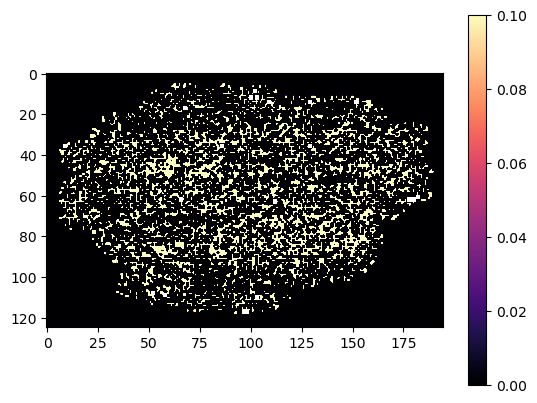

In [266]:
plt.imshow(anmb434_map, cmap='magma', vmin=0, vmax=0.1)
plt.colorbar()
plt.show()

In [297]:
wvl[237]

800.02

In [282]:
# Chlorophyll dd679
sample = sample_dict[sample_key[i]]
pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

for y in range(0, sample.shape[0]):
    for x in range(0, sample.shape[1]):
        if sample[y,x].any() == 0:
            pigment_map[y,x] = 0
        else:
            second_d = ss.savgol_filter(sample[y,x], 25, 3, deriv=2)
            pigment_map[y,x] = 19.304411 + (-5751.213505 * second_d[167]) # dd 494 nm

dd679_map = pigment_map.copy()

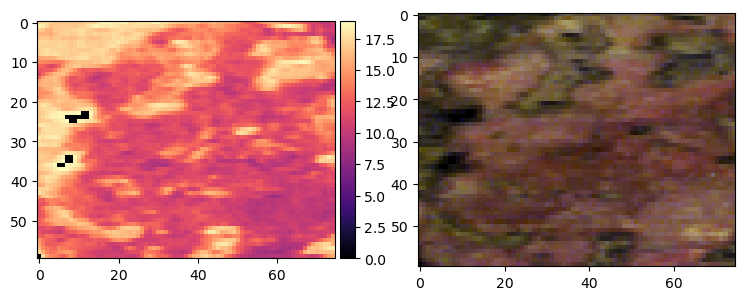

In [287]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(9,9))
# im0 = ax0.imshow(anmb563_map, interpolation='none', norm=None, cmap='magma')
im0 = ax0.imshow(dd679_map[30:90,30:105], cmap='magma')

divider = make_axes_locatable(ax0)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im0, cax=cax, orientation='vertical')

ax1.imshow(sample[30:90,30:105,(178,95,15)])

plt.show()

In [330]:
# Chlorophyll ddSR665
sample = sample_dict[sample_key[i]]
d_sample = ss.savgol_filter(sample, 40, 2, axis=2, deriv=1)

dSR665 = (dd_sample[:,:,237] / dd_sample[:,:,159])

pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

for y in range(0, sample.shape[0]):
    for x in range(0, sample.shape[1]):
        if dd_sample[y,x].any() == 0:
            pigment_map[y,x] = 0
        else:
            pigment_map[y,x] = 7.27876 + (-41.92870 * dSR665[y,x]) # ddSR665

dSR665_map = pigment_map.copy()

C:\Users\jcmontes\AppData\Local\Temp\ipykernel_7932\3492381774.py:5: RuntimeWarning: invalid value encountered in true_divide
  dSR665 = (dd_sample[:,:,237] / dd_sample[:,:,159])


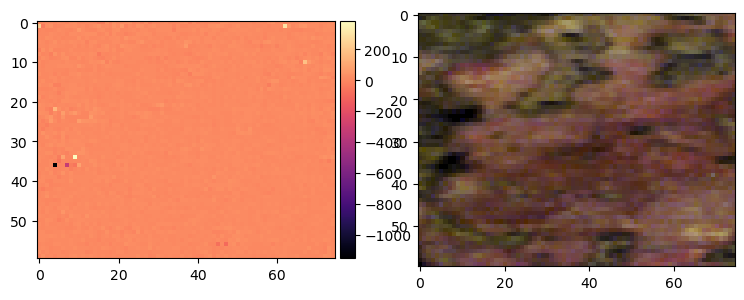

In [331]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(9,9))
# im0 = ax0.imshow(anmb563_map, interpolation='none', norm=None, cmap='magma')
im0 = ax0.imshow(dSR665_map[30:90,30:105], cmap='magma')

divider = make_axes_locatable(ax0)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im0, cax=cax, orientation='vertical')

ax1.imshow(sample[30:90,30:105,(178,95,15)])

plt.show()

C:\Users\jcmontes\AppData\Local\Temp\ipykernel_7932\1829727969.py:2: RuntimeWarning: invalid value encountered in true_divide
  ax0.imshow((d_sample[:,:,237] / d_sample[:,:,159]))


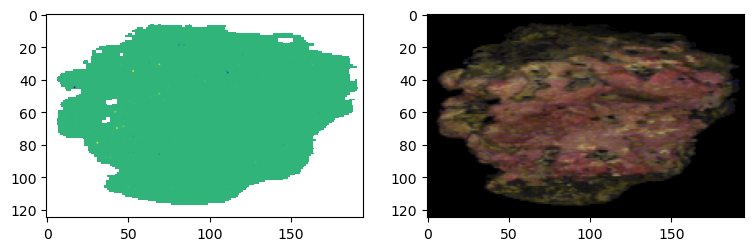

In [332]:
fig, (ax0,ax1) = plt.subplots(1,2, figsize=(9,9))
ax0.imshow((d_sample[:,:,237] / d_sample[:,:,159]))
ax1.imshow(sample[:,:,(178,95,15)])
plt.show()

In [367]:
# #dND_PE494 nm
# sample = sample_dict[sample_key[i]]
# pigment_map = np.empty((sample.shape[0], sample.shape[1], 1), dtype=np.float64)

# for y in range(0, sample.shape[0]):
#     for x in range(0, sample.shape[1]):
#         if sample[y,x].any() == 0:
#             pigment_map[y,x] = 0
#         else:
#             first_d = ss.savgol_filter(sample[y,x], 50, 3, deriv=1)
#             dND494 = (first_d[237] - first_d[59]) / (first_d[237] + first_d[59])
#             pigment_map[y,x] = 0.0534131 + (0.00379905 * dND494) # dND 494 nm
            
# dND494_map = pigment_map.copy()

In [368]:
# # # Display side by side
# f, (ax0, ax1) = plt.subplots(1, 2, figsize=(9,9), sharey=False)

# im0=ax0.imshow(dND494_map[10:50,40:100], interpolation='none', norm=None, cmap='magma')

# divider = make_axes_locatable(ax0)
# cax = divider.append_axes('right', size='5%', pad=0.05)
# fig.colorbar(im0, cax=cax, orientation='vertical')

# ax1.imshow(sample[10:50,40:100,(178,95,15)]) # Increase brightness https://www.youtube.com/watch?v=wDxmYKCNzE4&ab_channel=TheAIUniversity

# plt.tight_layout()
# plt.show()